# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

A subdirectory or file data already exists.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

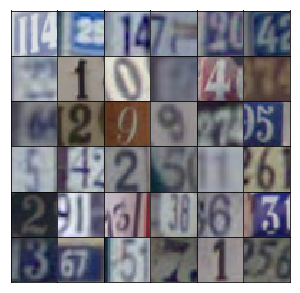

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4 * 4 * 1024)
        
        # Reshape for the convolution
        layer = tf.reshape(x, (-1, 4, 4, 1024))
        layer = tf.layers.batch_normalization(layer, training=training)
        layer = tf.maximum(alpha * layer, layer)
        # 4x4x1024
        
        # Add the convolutional layer - 8x8x512
        conv_layer = tf.layers.conv2d_transpose(layer, 512, 5, 2, padding='same')
        conv_layer = tf.layers.batch_normalization(conv_layer, training=training)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        
        # More convolutional layer - 16x16x256
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 256, 5, 2, padding='same')
        conv_layer = tf.layers.batch_normalization(conv_layer, training=training)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(conv_layer, output_dim, 5, 2, padding='same')
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # First convolutional layer - 16x16x64
        conv_layer = tf.layers.conv2d(x, 64, 5, 2, padding='same')
        
        # Second convolutional layer - 8x8x128
        conv_layer = tf.layers.conv2d(conv_layer, 128, 5, 2, padding='same')
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        
        # Third convolutional layer - 4x4x256
        conv_layer = tf.layers.conv2d(conv_layer, 256, 5, 2, padding='same')
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        
        # Reshape
        layer = tf.reshape(conv_layer, (-1, 4 * 4 * 256))
        
        # Output layer
        logits = tf.layers.dense(layer, 1)
        out = tf.nn.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an errror without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [17]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 256
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.2336... Generator Loss: 0.7954
Epoch 1/25... Discriminator Loss: 0.4836... Generator Loss: 2.6724
Epoch 1/25... Discriminator Loss: 0.1697... Generator Loss: 4.9615
Epoch 1/25... Discriminator Loss: 0.2812... Generator Loss: 2.1925
Epoch 1/25... Discriminator Loss: 0.2303... Generator Loss: 2.7149
Epoch 1/25... Discriminator Loss: 0.3985... Generator Loss: 1.4649
Epoch 1/25... Discriminator Loss: 0.3115... Generator Loss: 1.8791
Epoch 1/25... Discriminator Loss: 0.2745... Generator Loss: 1.9490
Epoch 1/25... Discriminator Loss: 0.1760... Generator Loss: 2.7701
Epoch 1/25... Discriminator Loss: 0.2072... Generator Loss: 2.1778


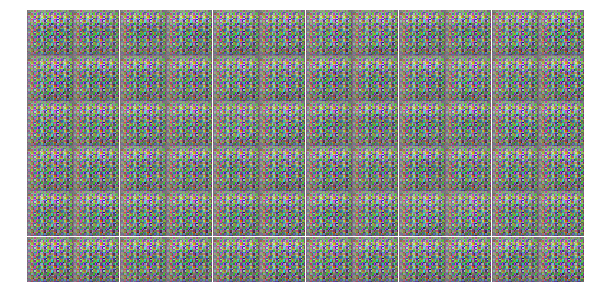

Epoch 1/25... Discriminator Loss: 0.1859... Generator Loss: 2.5532
Epoch 1/25... Discriminator Loss: 0.2273... Generator Loss: 2.5384
Epoch 1/25... Discriminator Loss: 0.3908... Generator Loss: 1.7509
Epoch 1/25... Discriminator Loss: 1.4740... Generator Loss: 2.4434
Epoch 1/25... Discriminator Loss: 0.9831... Generator Loss: 0.9727
Epoch 1/25... Discriminator Loss: 0.8346... Generator Loss: 1.3266
Epoch 1/25... Discriminator Loss: 0.6365... Generator Loss: 1.7371
Epoch 1/25... Discriminator Loss: 0.4975... Generator Loss: 2.5942
Epoch 1/25... Discriminator Loss: 0.5723... Generator Loss: 1.2755
Epoch 1/25... Discriminator Loss: 0.2627... Generator Loss: 2.6506


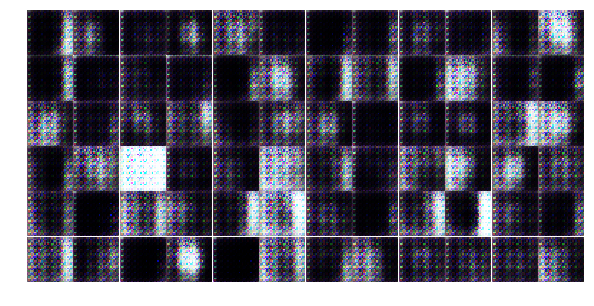

Epoch 1/25... Discriminator Loss: 0.1920... Generator Loss: 2.7247
Epoch 1/25... Discriminator Loss: 0.2687... Generator Loss: 2.0742
Epoch 1/25... Discriminator Loss: 0.3089... Generator Loss: 3.6804
Epoch 1/25... Discriminator Loss: 0.2648... Generator Loss: 2.1035
Epoch 1/25... Discriminator Loss: 0.2023... Generator Loss: 2.1102
Epoch 1/25... Discriminator Loss: 0.1636... Generator Loss: 2.5328
Epoch 1/25... Discriminator Loss: 0.2162... Generator Loss: 2.2529
Epoch 1/25... Discriminator Loss: 0.2459... Generator Loss: 2.3721
Epoch 2/25... Discriminator Loss: 0.1013... Generator Loss: 2.8030
Epoch 2/25... Discriminator Loss: 0.0725... Generator Loss: 3.4630


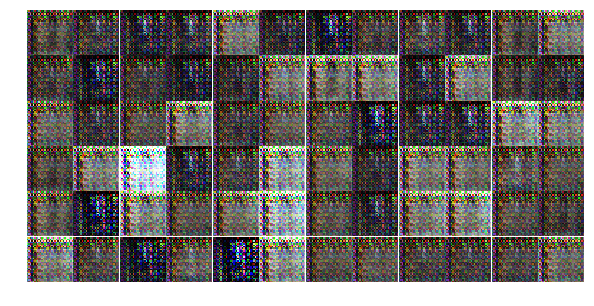

Epoch 2/25... Discriminator Loss: 0.9356... Generator Loss: 0.7140
Epoch 2/25... Discriminator Loss: 0.4693... Generator Loss: 2.0965
Epoch 2/25... Discriminator Loss: 0.5652... Generator Loss: 1.0699
Epoch 2/25... Discriminator Loss: 0.3107... Generator Loss: 2.1215
Epoch 2/25... Discriminator Loss: 0.5039... Generator Loss: 1.4265
Epoch 2/25... Discriminator Loss: 0.2676... Generator Loss: 2.1708
Epoch 2/25... Discriminator Loss: 0.7380... Generator Loss: 1.2929
Epoch 2/25... Discriminator Loss: 0.3775... Generator Loss: 1.6598
Epoch 2/25... Discriminator Loss: 0.4697... Generator Loss: 2.3390
Epoch 2/25... Discriminator Loss: 0.4326... Generator Loss: 3.3500


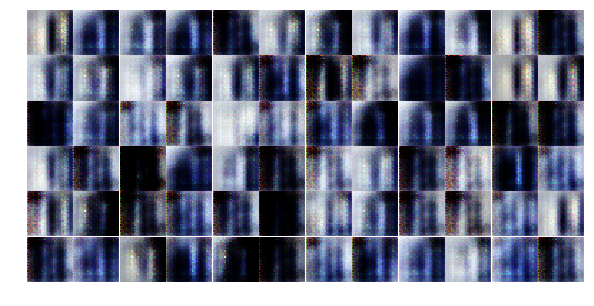

Epoch 2/25... Discriminator Loss: 0.3385... Generator Loss: 2.1686
Epoch 2/25... Discriminator Loss: 0.4770... Generator Loss: 1.2667
Epoch 2/25... Discriminator Loss: 0.6608... Generator Loss: 0.8629
Epoch 2/25... Discriminator Loss: 0.3838... Generator Loss: 3.0605
Epoch 2/25... Discriminator Loss: 0.7450... Generator Loss: 0.8025
Epoch 2/25... Discriminator Loss: 0.5343... Generator Loss: 2.6488
Epoch 2/25... Discriminator Loss: 0.7570... Generator Loss: 4.5685
Epoch 2/25... Discriminator Loss: 1.4666... Generator Loss: 2.1464
Epoch 2/25... Discriminator Loss: 0.9548... Generator Loss: 0.8065
Epoch 2/25... Discriminator Loss: 0.4431... Generator Loss: 2.1319


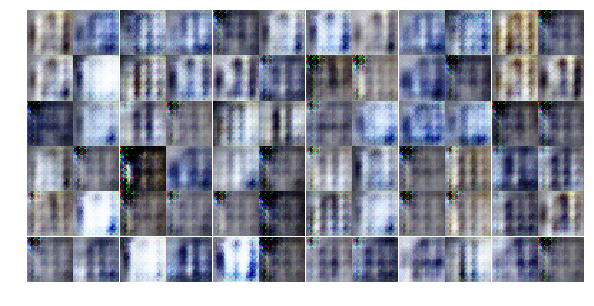

Epoch 2/25... Discriminator Loss: 1.2583... Generator Loss: 2.5327
Epoch 2/25... Discriminator Loss: 1.1743... Generator Loss: 2.1216
Epoch 2/25... Discriminator Loss: 0.7239... Generator Loss: 1.1130
Epoch 2/25... Discriminator Loss: 0.3864... Generator Loss: 2.0470
Epoch 2/25... Discriminator Loss: 0.6664... Generator Loss: 1.1094
Epoch 2/25... Discriminator Loss: 0.7383... Generator Loss: 1.4103
Epoch 2/25... Discriminator Loss: 0.7117... Generator Loss: 2.1146
Epoch 3/25... Discriminator Loss: 0.7831... Generator Loss: 1.7850
Epoch 3/25... Discriminator Loss: 0.7686... Generator Loss: 1.2466
Epoch 3/25... Discriminator Loss: 0.5171... Generator Loss: 1.9492


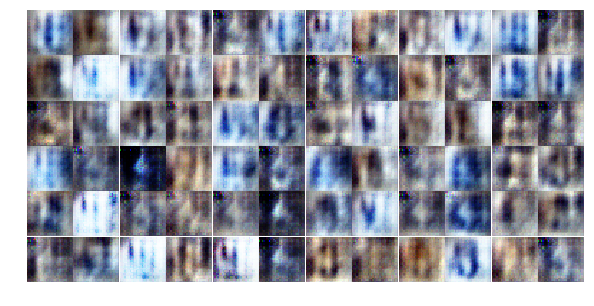

Epoch 3/25... Discriminator Loss: 0.4930... Generator Loss: 1.9936
Epoch 3/25... Discriminator Loss: 0.9787... Generator Loss: 0.6505
Epoch 3/25... Discriminator Loss: 0.3198... Generator Loss: 2.1460
Epoch 3/25... Discriminator Loss: 0.5853... Generator Loss: 1.9742
Epoch 3/25... Discriminator Loss: 0.7001... Generator Loss: 3.5652
Epoch 3/25... Discriminator Loss: 0.5680... Generator Loss: 2.2495
Epoch 3/25... Discriminator Loss: 0.4888... Generator Loss: 1.8930
Epoch 3/25... Discriminator Loss: 0.8219... Generator Loss: 1.0530
Epoch 3/25... Discriminator Loss: 1.0035... Generator Loss: 3.4630
Epoch 3/25... Discriminator Loss: 0.4013... Generator Loss: 2.2262


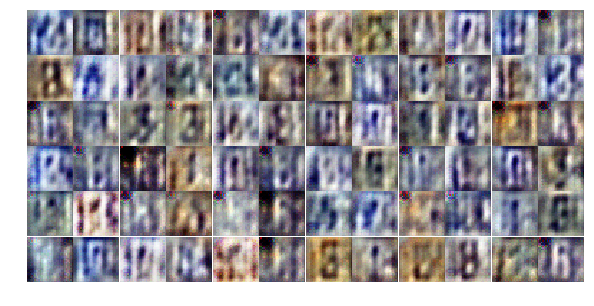

Epoch 3/25... Discriminator Loss: 0.8622... Generator Loss: 1.2744
Epoch 3/25... Discriminator Loss: 0.6914... Generator Loss: 1.6552
Epoch 3/25... Discriminator Loss: 0.5577... Generator Loss: 1.7851
Epoch 3/25... Discriminator Loss: 0.6312... Generator Loss: 2.2455
Epoch 3/25... Discriminator Loss: 1.1675... Generator Loss: 3.0883
Epoch 3/25... Discriminator Loss: 0.7732... Generator Loss: 2.4471
Epoch 3/25... Discriminator Loss: 0.5046... Generator Loss: 1.9867
Epoch 3/25... Discriminator Loss: 0.3143... Generator Loss: 4.2972
Epoch 3/25... Discriminator Loss: 0.3365... Generator Loss: 2.4116
Epoch 3/25... Discriminator Loss: 1.0286... Generator Loss: 0.7294


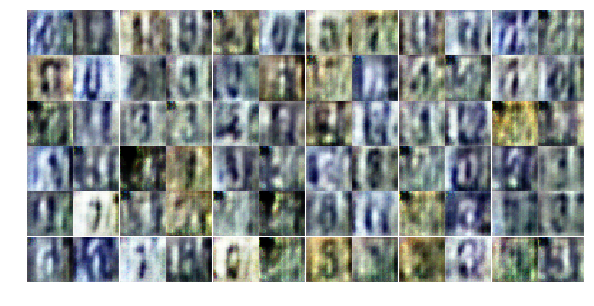

Epoch 3/25... Discriminator Loss: 0.8384... Generator Loss: 1.3967
Epoch 3/25... Discriminator Loss: 0.9429... Generator Loss: 0.8377
Epoch 3/25... Discriminator Loss: 0.5697... Generator Loss: 2.1365
Epoch 3/25... Discriminator Loss: 0.4615... Generator Loss: 2.1440
Epoch 3/25... Discriminator Loss: 0.5597... Generator Loss: 2.1383
Epoch 3/25... Discriminator Loss: 0.4878... Generator Loss: 2.6416
Epoch 4/25... Discriminator Loss: 0.2392... Generator Loss: 3.6131
Epoch 4/25... Discriminator Loss: 0.6494... Generator Loss: 1.3921
Epoch 4/25... Discriminator Loss: 0.6416... Generator Loss: 1.4220
Epoch 4/25... Discriminator Loss: 1.6434... Generator Loss: 4.1349


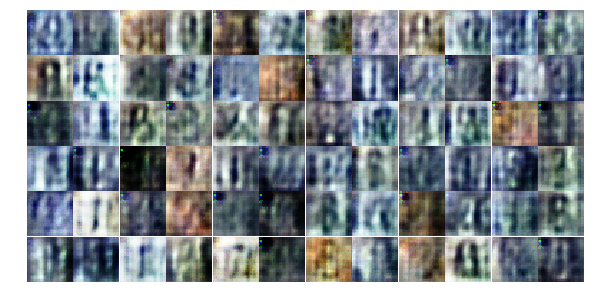

Epoch 4/25... Discriminator Loss: 0.3271... Generator Loss: 2.8627
Epoch 4/25... Discriminator Loss: 0.8748... Generator Loss: 2.4135
Epoch 4/25... Discriminator Loss: 0.6782... Generator Loss: 2.9842
Epoch 4/25... Discriminator Loss: 0.3595... Generator Loss: 2.0342
Epoch 4/25... Discriminator Loss: 0.4529... Generator Loss: 1.6919
Epoch 4/25... Discriminator Loss: 0.5720... Generator Loss: 1.1582
Epoch 4/25... Discriminator Loss: 1.1901... Generator Loss: 0.6031
Epoch 4/25... Discriminator Loss: 0.6644... Generator Loss: 1.5837
Epoch 4/25... Discriminator Loss: 0.7138... Generator Loss: 1.3254
Epoch 4/25... Discriminator Loss: 0.5588... Generator Loss: 1.9509


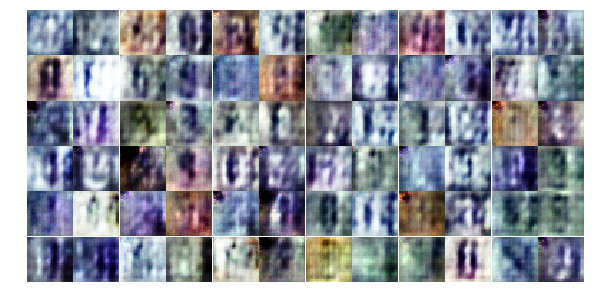

Epoch 4/25... Discriminator Loss: 0.4008... Generator Loss: 1.7681
Epoch 4/25... Discriminator Loss: 0.7711... Generator Loss: 1.0051
Epoch 4/25... Discriminator Loss: 0.6681... Generator Loss: 1.3867
Epoch 4/25... Discriminator Loss: 0.6506... Generator Loss: 2.4008
Epoch 4/25... Discriminator Loss: 0.2122... Generator Loss: 4.2982
Epoch 4/25... Discriminator Loss: 0.2236... Generator Loss: 5.0439
Epoch 4/25... Discriminator Loss: 1.1172... Generator Loss: 3.7418
Epoch 4/25... Discriminator Loss: 0.7447... Generator Loss: 1.0150
Epoch 4/25... Discriminator Loss: 0.7937... Generator Loss: 1.1005
Epoch 4/25... Discriminator Loss: 1.4288... Generator Loss: 0.5302


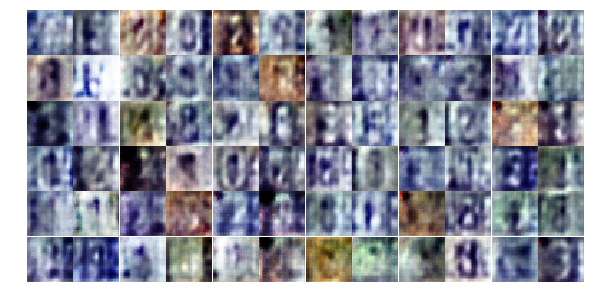

Epoch 4/25... Discriminator Loss: 0.5201... Generator Loss: 1.4550
Epoch 4/25... Discriminator Loss: 0.7404... Generator Loss: 2.3976
Epoch 4/25... Discriminator Loss: 0.4104... Generator Loss: 1.8356
Epoch 4/25... Discriminator Loss: 0.5268... Generator Loss: 4.1638
Epoch 5/25... Discriminator Loss: 0.3036... Generator Loss: 2.1199
Epoch 5/25... Discriminator Loss: 0.5130... Generator Loss: 1.8326
Epoch 5/25... Discriminator Loss: 0.5412... Generator Loss: 1.7610
Epoch 5/25... Discriminator Loss: 0.2154... Generator Loss: 3.6683
Epoch 5/25... Discriminator Loss: 2.4757... Generator Loss: 5.9961
Epoch 5/25... Discriminator Loss: 1.3286... Generator Loss: 0.4210


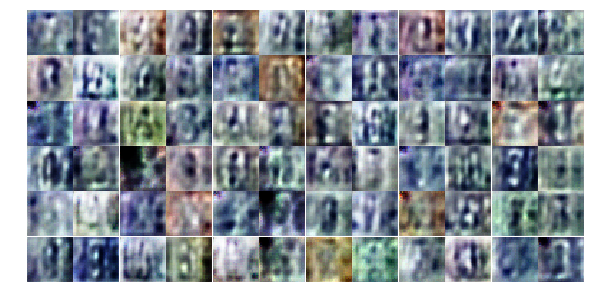

Epoch 5/25... Discriminator Loss: 0.6902... Generator Loss: 1.3103
Epoch 5/25... Discriminator Loss: 0.5338... Generator Loss: 1.8850
Epoch 5/25... Discriminator Loss: 0.5392... Generator Loss: 1.7046
Epoch 5/25... Discriminator Loss: 0.0838... Generator Loss: 6.6535
Epoch 5/25... Discriminator Loss: 0.8000... Generator Loss: 2.0375
Epoch 5/25... Discriminator Loss: 0.2743... Generator Loss: 3.3516
Epoch 5/25... Discriminator Loss: 0.5303... Generator Loss: 1.4761
Epoch 5/25... Discriminator Loss: 0.1605... Generator Loss: 3.6546
Epoch 5/25... Discriminator Loss: 0.9993... Generator Loss: 4.2290
Epoch 5/25... Discriminator Loss: 0.5766... Generator Loss: 1.8816


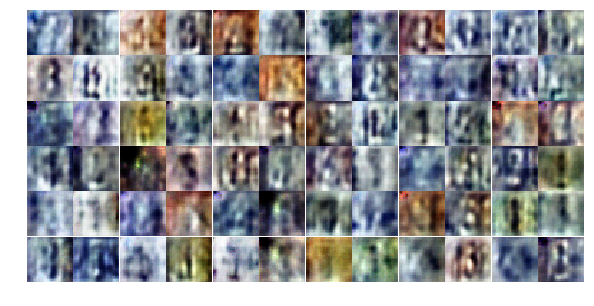

Epoch 5/25... Discriminator Loss: 0.4459... Generator Loss: 2.8542
Epoch 5/25... Discriminator Loss: 1.0903... Generator Loss: 2.8671
Epoch 5/25... Discriminator Loss: 0.3438... Generator Loss: 2.5704
Epoch 5/25... Discriminator Loss: 0.3592... Generator Loss: 3.8681
Epoch 5/25... Discriminator Loss: 0.4352... Generator Loss: 2.9199
Epoch 5/25... Discriminator Loss: 0.2698... Generator Loss: 5.1908
Epoch 5/25... Discriminator Loss: 0.4372... Generator Loss: 1.5457
Epoch 5/25... Discriminator Loss: 0.0807... Generator Loss: 10.5962
Epoch 5/25... Discriminator Loss: 0.4057... Generator Loss: 2.3549
Epoch 5/25... Discriminator Loss: 1.7198... Generator Loss: 3.3179


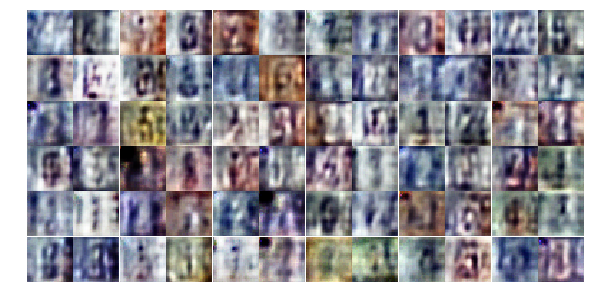

Epoch 5/25... Discriminator Loss: 0.9243... Generator Loss: 1.0093
Epoch 5/25... Discriminator Loss: 0.6253... Generator Loss: 1.7269
Epoch 5/25... Discriminator Loss: 0.3249... Generator Loss: 2.2597
Epoch 6/25... Discriminator Loss: 0.6929... Generator Loss: 2.7485
Epoch 6/25... Discriminator Loss: 0.3018... Generator Loss: 3.8943
Epoch 6/25... Discriminator Loss: 0.5981... Generator Loss: 3.0624
Epoch 6/25... Discriminator Loss: 0.8082... Generator Loss: 1.5633
Epoch 6/25... Discriminator Loss: 0.3396... Generator Loss: 3.2538
Epoch 6/25... Discriminator Loss: 0.3635... Generator Loss: 2.7221
Epoch 6/25... Discriminator Loss: 0.2130... Generator Loss: 8.1045


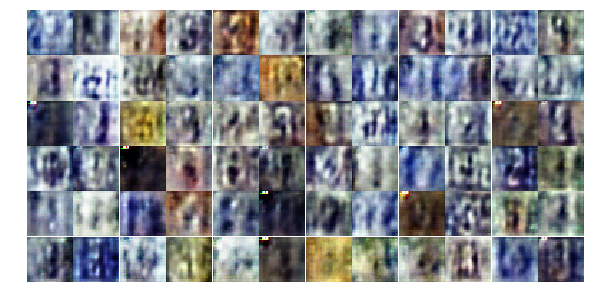

Epoch 6/25... Discriminator Loss: 0.2635... Generator Loss: 3.3292
Epoch 6/25... Discriminator Loss: 0.2375... Generator Loss: 3.5681
Epoch 6/25... Discriminator Loss: 0.1586... Generator Loss: 3.1060
Epoch 6/25... Discriminator Loss: 0.1839... Generator Loss: 3.6666
Epoch 6/25... Discriminator Loss: 0.3423... Generator Loss: 2.6206
Epoch 6/25... Discriminator Loss: 0.3128... Generator Loss: 1.9292
Epoch 6/25... Discriminator Loss: 1.4784... Generator Loss: 0.8664
Epoch 6/25... Discriminator Loss: 1.1420... Generator Loss: 0.8765
Epoch 6/25... Discriminator Loss: 1.4187... Generator Loss: 0.6838
Epoch 6/25... Discriminator Loss: 1.2308... Generator Loss: 0.9120


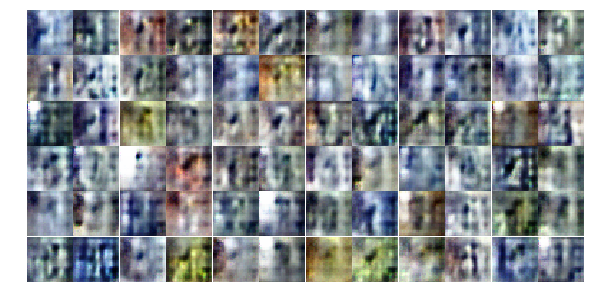

Epoch 6/25... Discriminator Loss: 1.5133... Generator Loss: 0.7444
Epoch 6/25... Discriminator Loss: 1.1970... Generator Loss: 0.8631
Epoch 6/25... Discriminator Loss: 1.1289... Generator Loss: 0.7685
Epoch 6/25... Discriminator Loss: 1.1378... Generator Loss: 0.7958
Epoch 6/25... Discriminator Loss: 1.1366... Generator Loss: 0.8147
Epoch 6/25... Discriminator Loss: 1.2879... Generator Loss: 1.6482
Epoch 6/25... Discriminator Loss: 1.1703... Generator Loss: 1.0450
Epoch 6/25... Discriminator Loss: 1.2760... Generator Loss: 2.5049
Epoch 6/25... Discriminator Loss: 1.1626... Generator Loss: 0.9285
Epoch 6/25... Discriminator Loss: 1.1642... Generator Loss: 1.0295


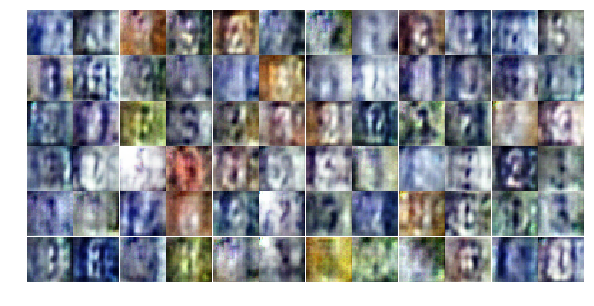

Epoch 6/25... Discriminator Loss: 1.2159... Generator Loss: 1.2968
Epoch 6/25... Discriminator Loss: 0.9969... Generator Loss: 2.0900
Epoch 7/25... Discriminator Loss: 1.4090... Generator Loss: 0.4143
Epoch 7/25... Discriminator Loss: 0.8504... Generator Loss: 1.5957
Epoch 7/25... Discriminator Loss: 0.5831... Generator Loss: 1.4815
Epoch 7/25... Discriminator Loss: 0.6940... Generator Loss: 1.8637
Epoch 7/25... Discriminator Loss: 0.4368... Generator Loss: 1.6620
Epoch 7/25... Discriminator Loss: 0.7950... Generator Loss: 1.5104
Epoch 7/25... Discriminator Loss: 0.8125... Generator Loss: 2.7827
Epoch 7/25... Discriminator Loss: 1.5722... Generator Loss: 0.3407


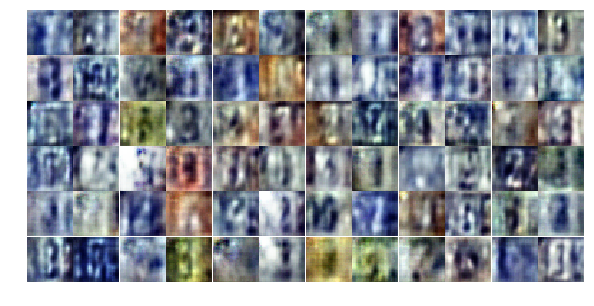

Epoch 7/25... Discriminator Loss: 0.9267... Generator Loss: 1.0030
Epoch 7/25... Discriminator Loss: 0.7454... Generator Loss: 1.4885
Epoch 7/25... Discriminator Loss: 1.0051... Generator Loss: 1.5272
Epoch 7/25... Discriminator Loss: 0.6756... Generator Loss: 3.2876
Epoch 7/25... Discriminator Loss: 0.1904... Generator Loss: 2.9729
Epoch 7/25... Discriminator Loss: 1.1208... Generator Loss: 1.3554
Epoch 7/25... Discriminator Loss: 0.5208... Generator Loss: 1.8376
Epoch 7/25... Discriminator Loss: 0.2957... Generator Loss: 2.2923
Epoch 7/25... Discriminator Loss: 0.5378... Generator Loss: 1.4805
Epoch 7/25... Discriminator Loss: 0.7452... Generator Loss: 1.0012


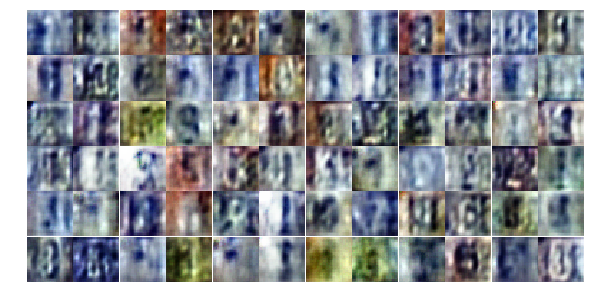

Epoch 7/25... Discriminator Loss: 0.3865... Generator Loss: 2.8681
Epoch 7/25... Discriminator Loss: 0.5454... Generator Loss: 2.1490
Epoch 7/25... Discriminator Loss: 0.7681... Generator Loss: 2.5616
Epoch 7/25... Discriminator Loss: 0.5497... Generator Loss: 1.2645
Epoch 7/25... Discriminator Loss: 0.9221... Generator Loss: 0.7393
Epoch 7/25... Discriminator Loss: 0.6973... Generator Loss: 1.3969
Epoch 7/25... Discriminator Loss: 0.6042... Generator Loss: 1.4162
Epoch 7/25... Discriminator Loss: 0.8005... Generator Loss: 1.1989
Epoch 7/25... Discriminator Loss: 0.8087... Generator Loss: 0.9914
Epoch 7/25... Discriminator Loss: 0.5298... Generator Loss: 1.8922


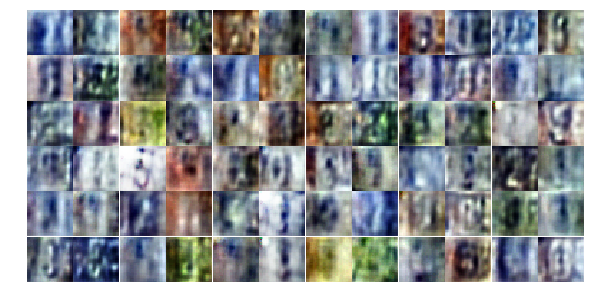

Epoch 8/25... Discriminator Loss: 0.5736... Generator Loss: 2.6644
Epoch 8/25... Discriminator Loss: 0.4057... Generator Loss: 5.0143
Epoch 8/25... Discriminator Loss: 0.6632... Generator Loss: 1.6571
Epoch 8/25... Discriminator Loss: 0.5764... Generator Loss: 1.7111
Epoch 8/25... Discriminator Loss: 0.4371... Generator Loss: 1.9521
Epoch 8/25... Discriminator Loss: 0.1694... Generator Loss: 4.7478
Epoch 8/25... Discriminator Loss: 0.2990... Generator Loss: 3.0852
Epoch 8/25... Discriminator Loss: 1.0563... Generator Loss: 1.4300
Epoch 8/25... Discriminator Loss: 1.0449... Generator Loss: 0.7412
Epoch 8/25... Discriminator Loss: 1.6028... Generator Loss: 2.6312


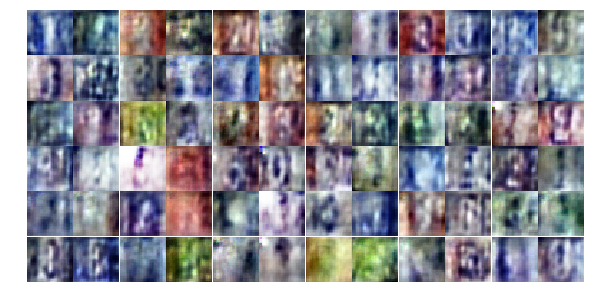

Epoch 8/25... Discriminator Loss: 1.0694... Generator Loss: 1.3307
Epoch 8/25... Discriminator Loss: 1.0509... Generator Loss: 0.8414
Epoch 8/25... Discriminator Loss: 0.5854... Generator Loss: 2.6919
Epoch 8/25... Discriminator Loss: 0.3407... Generator Loss: 2.3222
Epoch 8/25... Discriminator Loss: 1.3628... Generator Loss: 3.5066
Epoch 8/25... Discriminator Loss: 1.6331... Generator Loss: 0.5512
Epoch 8/25... Discriminator Loss: 1.0634... Generator Loss: 0.7851
Epoch 8/25... Discriminator Loss: 0.8224... Generator Loss: 1.5563
Epoch 8/25... Discriminator Loss: 0.4330... Generator Loss: 2.0151
Epoch 8/25... Discriminator Loss: 0.9431... Generator Loss: 2.1072


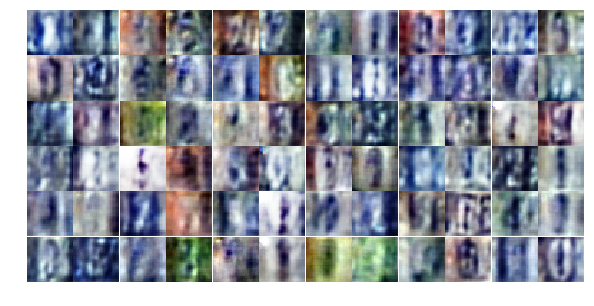

Epoch 8/25... Discriminator Loss: 0.2072... Generator Loss: 2.3715
Epoch 8/25... Discriminator Loss: 0.6451... Generator Loss: 1.2207
Epoch 8/25... Discriminator Loss: 0.8239... Generator Loss: 1.2193
Epoch 8/25... Discriminator Loss: 1.2604... Generator Loss: 0.7866
Epoch 8/25... Discriminator Loss: 1.0844... Generator Loss: 1.8815
Epoch 8/25... Discriminator Loss: 0.1983... Generator Loss: 3.7804
Epoch 8/25... Discriminator Loss: 0.2925... Generator Loss: 2.7103
Epoch 8/25... Discriminator Loss: 0.3796... Generator Loss: 1.9451
Epoch 8/25... Discriminator Loss: 0.1929... Generator Loss: 3.7499
Epoch 9/25... Discriminator Loss: 1.0806... Generator Loss: 0.5962


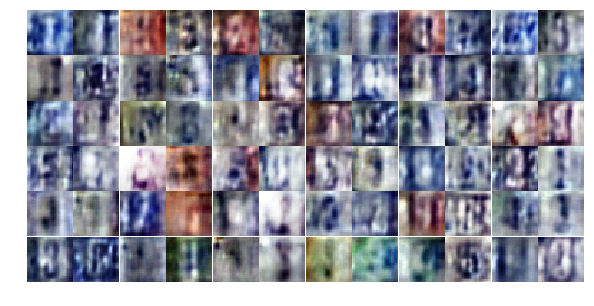

Epoch 9/25... Discriminator Loss: 0.6693... Generator Loss: 1.2746
Epoch 9/25... Discriminator Loss: 0.7529... Generator Loss: 1.0182
Epoch 9/25... Discriminator Loss: 0.0899... Generator Loss: 4.8747
Epoch 9/25... Discriminator Loss: 0.3541... Generator Loss: 1.7232
Epoch 9/25... Discriminator Loss: 1.9951... Generator Loss: 0.1935
Epoch 9/25... Discriminator Loss: 1.5491... Generator Loss: 1.7493
Epoch 9/25... Discriminator Loss: 0.7481... Generator Loss: 1.1341
Epoch 9/25... Discriminator Loss: 1.6605... Generator Loss: 1.3677
Epoch 9/25... Discriminator Loss: 1.0676... Generator Loss: 1.5016
Epoch 9/25... Discriminator Loss: 0.6572... Generator Loss: 1.4767


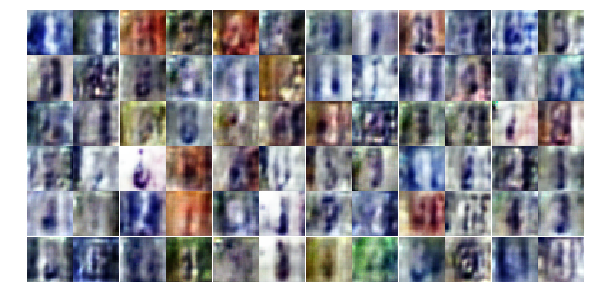

Epoch 9/25... Discriminator Loss: 0.6421... Generator Loss: 1.3890
Epoch 9/25... Discriminator Loss: 0.5271... Generator Loss: 2.1418
Epoch 9/25... Discriminator Loss: 1.2409... Generator Loss: 0.4335
Epoch 9/25... Discriminator Loss: 1.3338... Generator Loss: 0.8902
Epoch 9/25... Discriminator Loss: 0.4400... Generator Loss: 1.9096
Epoch 9/25... Discriminator Loss: 0.3583... Generator Loss: 2.7917
Epoch 9/25... Discriminator Loss: 1.2846... Generator Loss: 2.8485
Epoch 9/25... Discriminator Loss: 0.6538... Generator Loss: 1.9863
Epoch 9/25... Discriminator Loss: 0.3004... Generator Loss: 1.8326
Epoch 9/25... Discriminator Loss: 1.2891... Generator Loss: 2.1127


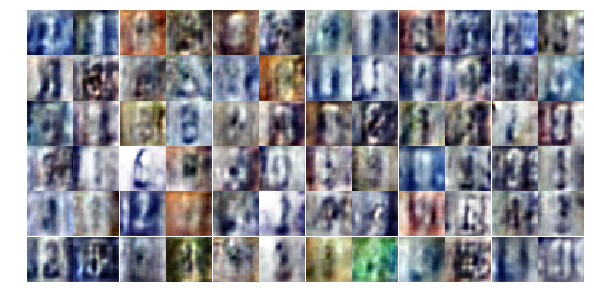

Epoch 9/25... Discriminator Loss: 0.3274... Generator Loss: 2.0787
Epoch 9/25... Discriminator Loss: 1.1054... Generator Loss: 0.5932
Epoch 9/25... Discriminator Loss: 0.5645... Generator Loss: 1.3079
Epoch 9/25... Discriminator Loss: 0.4494... Generator Loss: 2.0787
Epoch 9/25... Discriminator Loss: 0.4917... Generator Loss: 1.9064
Epoch 9/25... Discriminator Loss: 0.9502... Generator Loss: 0.7316
Epoch 9/25... Discriminator Loss: 0.2697... Generator Loss: 3.1900
Epoch 9/25... Discriminator Loss: 0.2816... Generator Loss: 1.9145
Epoch 10/25... Discriminator Loss: 0.6756... Generator Loss: 1.4593
Epoch 10/25... Discriminator Loss: 0.8048... Generator Loss: 1.9985


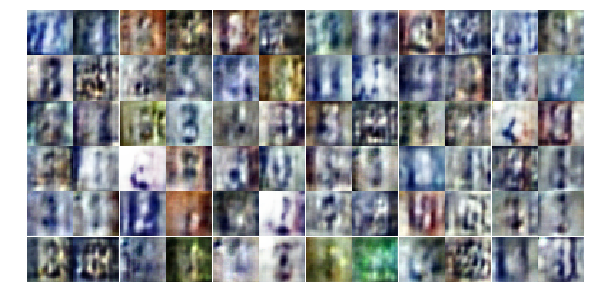

Epoch 10/25... Discriminator Loss: 0.6741... Generator Loss: 2.4178
Epoch 10/25... Discriminator Loss: 1.5426... Generator Loss: 0.3393
Epoch 10/25... Discriminator Loss: 0.5625... Generator Loss: 2.2597
Epoch 10/25... Discriminator Loss: 0.7666... Generator Loss: 1.8333
Epoch 10/25... Discriminator Loss: 0.8025... Generator Loss: 1.0046
Epoch 10/25... Discriminator Loss: 0.7003... Generator Loss: 1.6480
Epoch 10/25... Discriminator Loss: 0.8617... Generator Loss: 2.0484
Epoch 10/25... Discriminator Loss: 0.8089... Generator Loss: 1.6913
Epoch 10/25... Discriminator Loss: 0.9396... Generator Loss: 4.4824
Epoch 10/25... Discriminator Loss: 0.1892... Generator Loss: 6.8529


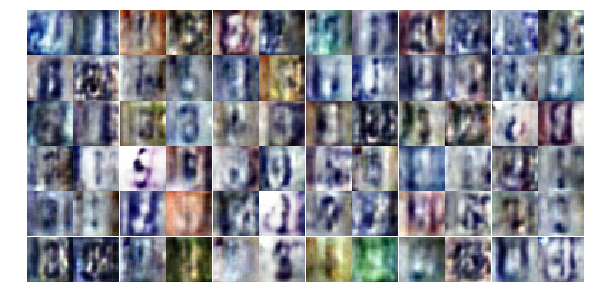

Epoch 10/25... Discriminator Loss: 0.5036... Generator Loss: 2.2254
Epoch 10/25... Discriminator Loss: 0.5378... Generator Loss: 1.2005
Epoch 10/25... Discriminator Loss: 0.8192... Generator Loss: 0.8131
Epoch 10/25... Discriminator Loss: 1.1914... Generator Loss: 0.5034
Epoch 10/25... Discriminator Loss: 0.2829... Generator Loss: 3.4493
Epoch 10/25... Discriminator Loss: 0.1950... Generator Loss: 3.2881
Epoch 10/25... Discriminator Loss: 0.3041... Generator Loss: 3.8580
Epoch 10/25... Discriminator Loss: 0.5329... Generator Loss: 1.3968
Epoch 10/25... Discriminator Loss: 0.5931... Generator Loss: 1.2696
Epoch 10/25... Discriminator Loss: 0.8152... Generator Loss: 0.7568


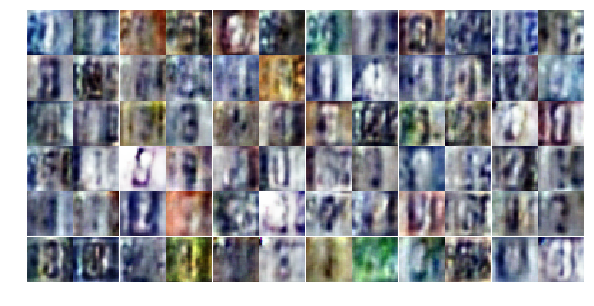

Epoch 10/25... Discriminator Loss: 1.0359... Generator Loss: 1.7573
Epoch 10/25... Discriminator Loss: 0.1925... Generator Loss: 2.5744
Epoch 10/25... Discriminator Loss: 0.3297... Generator Loss: 2.0110
Epoch 10/25... Discriminator Loss: 0.3611... Generator Loss: 2.8075
Epoch 10/25... Discriminator Loss: 0.2142... Generator Loss: 2.7410
Epoch 10/25... Discriminator Loss: 0.1626... Generator Loss: 3.0183
Epoch 10/25... Discriminator Loss: 0.3499... Generator Loss: 4.3349
Epoch 11/25... Discriminator Loss: 0.5288... Generator Loss: 1.3876
Epoch 11/25... Discriminator Loss: 0.1448... Generator Loss: 3.4368
Epoch 11/25... Discriminator Loss: 0.5918... Generator Loss: 1.6606


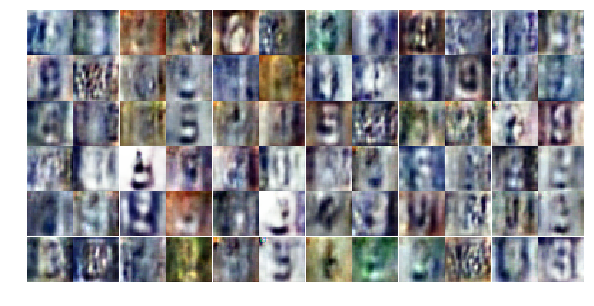

Epoch 11/25... Discriminator Loss: 1.9513... Generator Loss: 0.2761
Epoch 11/25... Discriminator Loss: 1.6281... Generator Loss: 3.6973
Epoch 11/25... Discriminator Loss: 1.1615... Generator Loss: 0.7058
Epoch 11/25... Discriminator Loss: 1.4442... Generator Loss: 0.6221
Epoch 11/25... Discriminator Loss: 0.8878... Generator Loss: 0.9113
Epoch 11/25... Discriminator Loss: 0.7266... Generator Loss: 1.4076
Epoch 11/25... Discriminator Loss: 0.8888... Generator Loss: 1.3069
Epoch 11/25... Discriminator Loss: 0.6125... Generator Loss: 1.4898
Epoch 11/25... Discriminator Loss: 0.6094... Generator Loss: 1.8331
Epoch 11/25... Discriminator Loss: 0.5111... Generator Loss: 1.7103


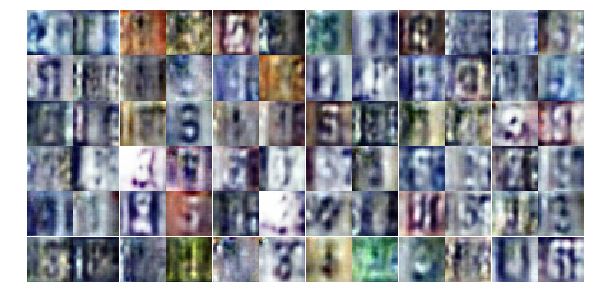

Epoch 11/25... Discriminator Loss: 1.5649... Generator Loss: 0.3213
Epoch 11/25... Discriminator Loss: 0.9971... Generator Loss: 0.9331
Epoch 11/25... Discriminator Loss: 0.3624... Generator Loss: 2.2771
Epoch 11/25... Discriminator Loss: 0.4664... Generator Loss: 1.4598
Epoch 11/25... Discriminator Loss: 0.1559... Generator Loss: 3.4643
Epoch 11/25... Discriminator Loss: 0.7270... Generator Loss: 1.7696
Epoch 11/25... Discriminator Loss: 0.9858... Generator Loss: 2.6604
Epoch 11/25... Discriminator Loss: 0.7438... Generator Loss: 1.2770
Epoch 11/25... Discriminator Loss: 0.6848... Generator Loss: 2.4434
Epoch 11/25... Discriminator Loss: 0.4582... Generator Loss: 1.3380


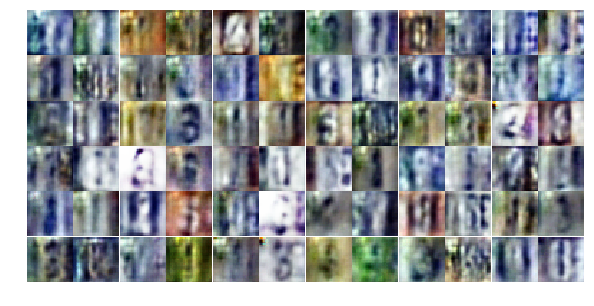

Epoch 11/25... Discriminator Loss: 0.8294... Generator Loss: 0.9241
Epoch 11/25... Discriminator Loss: 0.8061... Generator Loss: 0.8812
Epoch 11/25... Discriminator Loss: 0.6125... Generator Loss: 2.5985
Epoch 11/25... Discriminator Loss: 0.1504... Generator Loss: 3.7632
Epoch 11/25... Discriminator Loss: 0.5273... Generator Loss: 1.6926
Epoch 12/25... Discriminator Loss: 0.9958... Generator Loss: 1.6524
Epoch 12/25... Discriminator Loss: 0.6964... Generator Loss: 1.0825
Epoch 12/25... Discriminator Loss: 0.9678... Generator Loss: 1.5877
Epoch 12/25... Discriminator Loss: 1.2975... Generator Loss: 0.4367
Epoch 12/25... Discriminator Loss: 0.9203... Generator Loss: 4.7832


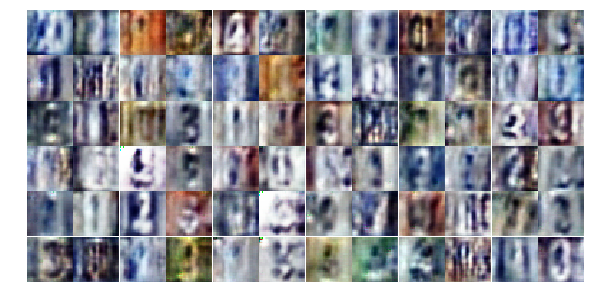

Epoch 12/25... Discriminator Loss: 0.6063... Generator Loss: 1.2981
Epoch 12/25... Discriminator Loss: 0.4221... Generator Loss: 1.6305
Epoch 12/25... Discriminator Loss: 0.1855... Generator Loss: 2.6250
Epoch 12/25... Discriminator Loss: 0.2027... Generator Loss: 2.6743
Epoch 12/25... Discriminator Loss: 0.0670... Generator Loss: 6.5202
Epoch 12/25... Discriminator Loss: 0.3128... Generator Loss: 2.2146
Epoch 12/25... Discriminator Loss: 0.1534... Generator Loss: 3.3746
Epoch 12/25... Discriminator Loss: 0.1110... Generator Loss: 4.1461
Epoch 12/25... Discriminator Loss: 0.8833... Generator Loss: 1.0314
Epoch 12/25... Discriminator Loss: 1.7883... Generator Loss: 0.3174


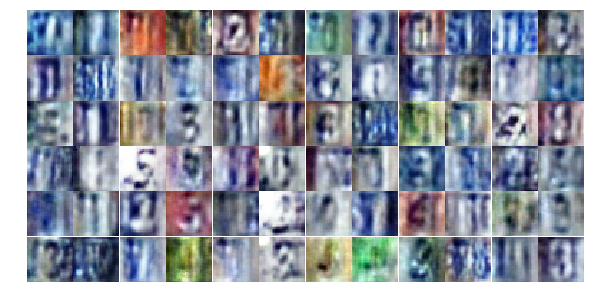

Epoch 12/25... Discriminator Loss: 0.6912... Generator Loss: 1.1857
Epoch 12/25... Discriminator Loss: 0.5167... Generator Loss: 1.7653
Epoch 12/25... Discriminator Loss: 1.6694... Generator Loss: 0.3152
Epoch 12/25... Discriminator Loss: 1.3547... Generator Loss: 2.3195
Epoch 12/25... Discriminator Loss: 0.6184... Generator Loss: 1.0832
Epoch 12/25... Discriminator Loss: 0.0564... Generator Loss: 8.4748
Epoch 12/25... Discriminator Loss: 0.6781... Generator Loss: 0.9952
Epoch 12/25... Discriminator Loss: 0.1836... Generator Loss: 3.2647
Epoch 12/25... Discriminator Loss: 0.9551... Generator Loss: 1.2964
Epoch 12/25... Discriminator Loss: 0.5150... Generator Loss: 1.5584


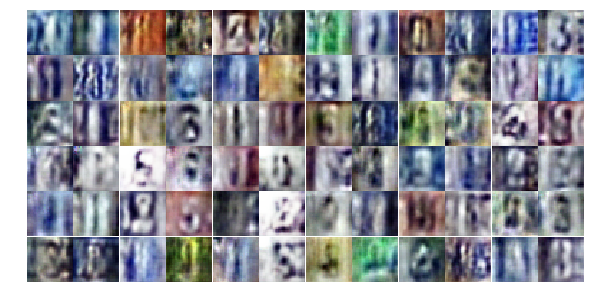

Epoch 12/25... Discriminator Loss: 1.0193... Generator Loss: 0.6849
Epoch 12/25... Discriminator Loss: 0.7776... Generator Loss: 0.8786
Epoch 12/25... Discriminator Loss: 0.1275... Generator Loss: 3.9373
Epoch 12/25... Discriminator Loss: 1.1088... Generator Loss: 2.0665
Epoch 13/25... Discriminator Loss: 0.5142... Generator Loss: 2.1753
Epoch 13/25... Discriminator Loss: 1.9148... Generator Loss: 0.2049
Epoch 13/25... Discriminator Loss: 0.5484... Generator Loss: 1.7378
Epoch 13/25... Discriminator Loss: 0.8333... Generator Loss: 2.2504
Epoch 13/25... Discriminator Loss: 0.6385... Generator Loss: 2.1251
Epoch 13/25... Discriminator Loss: 1.4769... Generator Loss: 1.4331


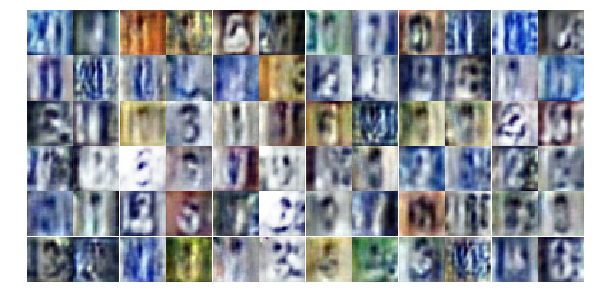

Epoch 13/25... Discriminator Loss: 0.6688... Generator Loss: 1.3035
Epoch 13/25... Discriminator Loss: 0.9413... Generator Loss: 0.7704
Epoch 13/25... Discriminator Loss: 0.8392... Generator Loss: 1.7823
Epoch 13/25... Discriminator Loss: 1.0864... Generator Loss: 0.7829
Epoch 13/25... Discriminator Loss: 0.7313... Generator Loss: 1.0129
Epoch 13/25... Discriminator Loss: 0.6053... Generator Loss: 1.4324
Epoch 13/25... Discriminator Loss: 1.1198... Generator Loss: 0.7518
Epoch 13/25... Discriminator Loss: 0.6781... Generator Loss: 1.5592
Epoch 13/25... Discriminator Loss: 0.5022... Generator Loss: 1.5968
Epoch 13/25... Discriminator Loss: 0.4986... Generator Loss: 2.1852


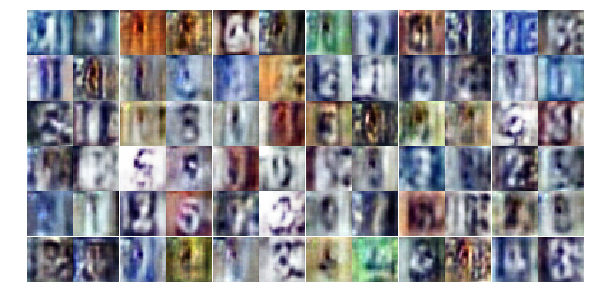

Epoch 13/25... Discriminator Loss: 0.2529... Generator Loss: 1.9576
Epoch 13/25... Discriminator Loss: 0.4019... Generator Loss: 1.7214
Epoch 13/25... Discriminator Loss: 0.3877... Generator Loss: 2.9970
Epoch 13/25... Discriminator Loss: 0.2545... Generator Loss: 2.8636
Epoch 13/25... Discriminator Loss: 0.0500... Generator Loss: 3.9216
Epoch 13/25... Discriminator Loss: 0.0804... Generator Loss: 4.5025
Epoch 13/25... Discriminator Loss: 0.0614... Generator Loss: 4.1467
Epoch 13/25... Discriminator Loss: 0.0988... Generator Loss: 3.0664
Epoch 13/25... Discriminator Loss: 0.1268... Generator Loss: 2.8059
Epoch 13/25... Discriminator Loss: 0.0596... Generator Loss: 4.0409


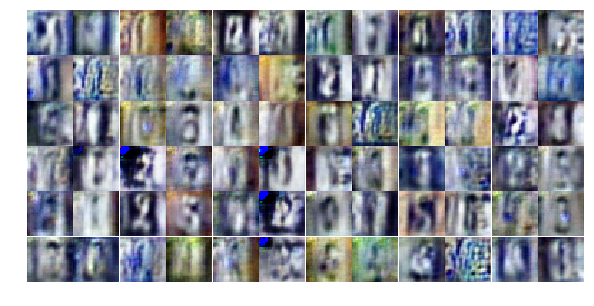

Epoch 13/25... Discriminator Loss: 0.2643... Generator Loss: 1.8235
Epoch 13/25... Discriminator Loss: 1.8338... Generator Loss: 0.2209
Epoch 13/25... Discriminator Loss: 0.9007... Generator Loss: 0.8230
Epoch 14/25... Discriminator Loss: 1.0724... Generator Loss: 0.6643
Epoch 14/25... Discriminator Loss: 1.5257... Generator Loss: 0.3772
Epoch 14/25... Discriminator Loss: 0.2488... Generator Loss: 3.3836
Epoch 14/25... Discriminator Loss: 0.8097... Generator Loss: 1.2910
Epoch 14/25... Discriminator Loss: 0.9327... Generator Loss: 0.8793
Epoch 14/25... Discriminator Loss: 0.9747... Generator Loss: 0.8030
Epoch 14/25... Discriminator Loss: 1.1190... Generator Loss: 0.6283


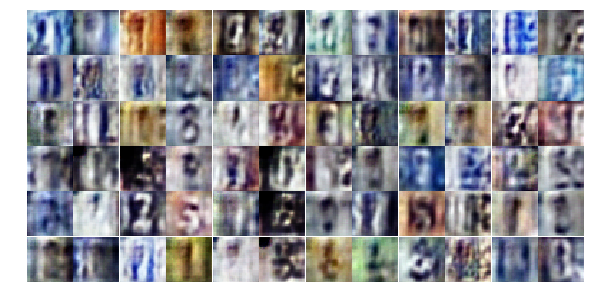

Epoch 14/25... Discriminator Loss: 1.0750... Generator Loss: 1.1203
Epoch 14/25... Discriminator Loss: 0.8500... Generator Loss: 1.1668
Epoch 14/25... Discriminator Loss: 0.9675... Generator Loss: 1.0110
Epoch 14/25... Discriminator Loss: 0.8616... Generator Loss: 1.1906
Epoch 14/25... Discriminator Loss: 1.0550... Generator Loss: 1.7157
Epoch 14/25... Discriminator Loss: 0.8445... Generator Loss: 1.2273
Epoch 14/25... Discriminator Loss: 0.8754... Generator Loss: 1.3463
Epoch 14/25... Discriminator Loss: 0.4716... Generator Loss: 1.4464
Epoch 14/25... Discriminator Loss: 1.2641... Generator Loss: 0.5483
Epoch 14/25... Discriminator Loss: 0.8154... Generator Loss: 1.0039


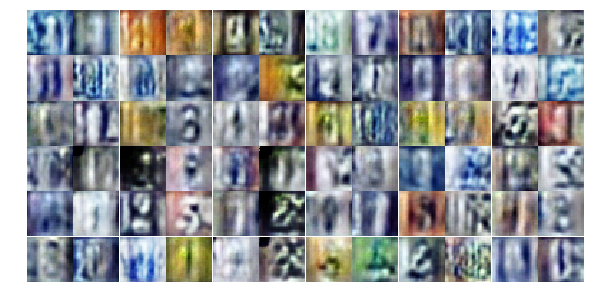

Epoch 14/25... Discriminator Loss: 1.1336... Generator Loss: 0.6959
Epoch 14/25... Discriminator Loss: 1.1615... Generator Loss: 0.6395
Epoch 14/25... Discriminator Loss: 0.7855... Generator Loss: 1.2840
Epoch 14/25... Discriminator Loss: 1.0744... Generator Loss: 0.8153
Epoch 14/25... Discriminator Loss: 0.9952... Generator Loss: 1.3864
Epoch 14/25... Discriminator Loss: 0.8313... Generator Loss: 1.0571
Epoch 14/25... Discriminator Loss: 1.0748... Generator Loss: 2.2817
Epoch 14/25... Discriminator Loss: 0.6999... Generator Loss: 1.0688
Epoch 14/25... Discriminator Loss: 0.8399... Generator Loss: 1.4786
Epoch 14/25... Discriminator Loss: 0.8864... Generator Loss: 0.9259


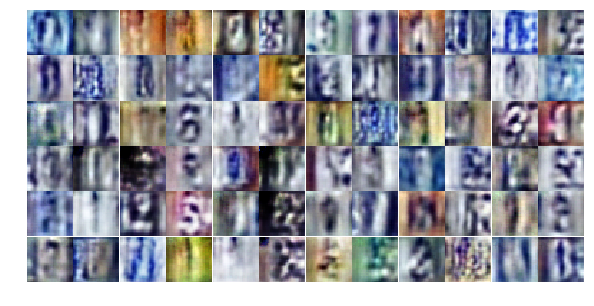

Epoch 14/25... Discriminator Loss: 0.8660... Generator Loss: 0.8275
Epoch 15/25... Discriminator Loss: 0.5832... Generator Loss: 1.5596
Epoch 15/25... Discriminator Loss: 0.6852... Generator Loss: 1.4776
Epoch 15/25... Discriminator Loss: 0.8065... Generator Loss: 1.2234
Epoch 15/25... Discriminator Loss: 0.9567... Generator Loss: 1.2337
Epoch 15/25... Discriminator Loss: 0.9290... Generator Loss: 0.8336
Epoch 15/25... Discriminator Loss: 0.9574... Generator Loss: 1.2315
Epoch 15/25... Discriminator Loss: 0.9027... Generator Loss: 0.8864
Epoch 15/25... Discriminator Loss: 0.9177... Generator Loss: 1.2460
Epoch 15/25... Discriminator Loss: 0.9715... Generator Loss: 1.1156


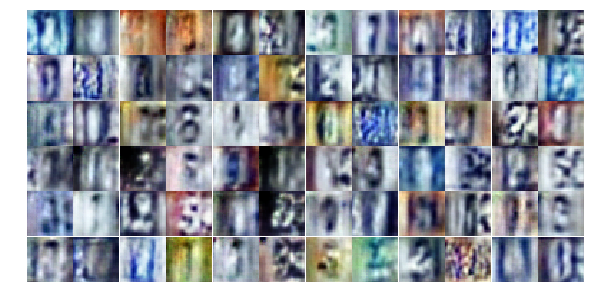

Epoch 15/25... Discriminator Loss: 0.9943... Generator Loss: 1.7828
Epoch 15/25... Discriminator Loss: 0.9605... Generator Loss: 0.7991
Epoch 15/25... Discriminator Loss: 0.6222... Generator Loss: 2.4195
Epoch 15/25... Discriminator Loss: 0.7042... Generator Loss: 1.0639
Epoch 15/25... Discriminator Loss: 0.9001... Generator Loss: 0.8072
Epoch 15/25... Discriminator Loss: 0.7190... Generator Loss: 1.6148
Epoch 15/25... Discriminator Loss: 0.7736... Generator Loss: 1.0035
Epoch 15/25... Discriminator Loss: 0.6687... Generator Loss: 1.1901
Epoch 15/25... Discriminator Loss: 0.6493... Generator Loss: 1.4599
Epoch 15/25... Discriminator Loss: 0.7834... Generator Loss: 0.9737


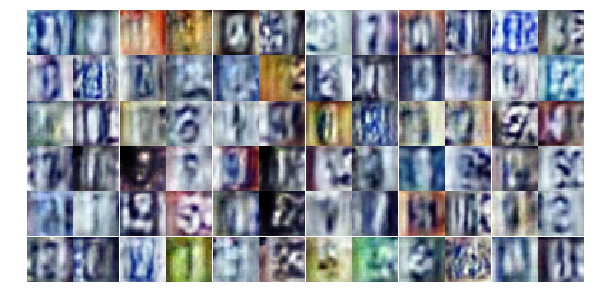

Epoch 15/25... Discriminator Loss: 1.2309... Generator Loss: 0.4697
Epoch 15/25... Discriminator Loss: 0.7570... Generator Loss: 1.0880
Epoch 15/25... Discriminator Loss: 0.7055... Generator Loss: 1.9260
Epoch 15/25... Discriminator Loss: 0.8056... Generator Loss: 1.2738
Epoch 15/25... Discriminator Loss: 0.9511... Generator Loss: 1.3551
Epoch 15/25... Discriminator Loss: 0.6981... Generator Loss: 1.0190
Epoch 15/25... Discriminator Loss: 0.8556... Generator Loss: 0.9639
Epoch 15/25... Discriminator Loss: 0.6035... Generator Loss: 1.6122
Epoch 15/25... Discriminator Loss: 1.2426... Generator Loss: 0.4986
Epoch 15/25... Discriminator Loss: 0.9693... Generator Loss: 1.1368


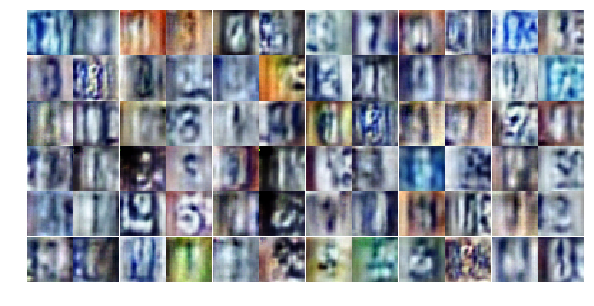

Epoch 16/25... Discriminator Loss: 0.6499... Generator Loss: 1.7254
Epoch 16/25... Discriminator Loss: 0.5749... Generator Loss: 1.2701
Epoch 16/25... Discriminator Loss: 0.7447... Generator Loss: 1.3060
Epoch 16/25... Discriminator Loss: 0.7884... Generator Loss: 0.8265
Epoch 16/25... Discriminator Loss: 0.6485... Generator Loss: 1.2993
Epoch 16/25... Discriminator Loss: 0.7931... Generator Loss: 1.1948
Epoch 16/25... Discriminator Loss: 0.4363... Generator Loss: 1.6341
Epoch 16/25... Discriminator Loss: 1.2807... Generator Loss: 2.5603
Epoch 16/25... Discriminator Loss: 0.9970... Generator Loss: 1.2223
Epoch 16/25... Discriminator Loss: 0.9920... Generator Loss: 0.6521


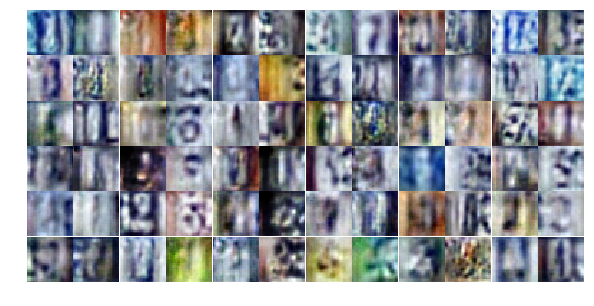

Epoch 16/25... Discriminator Loss: 0.7089... Generator Loss: 1.0119
Epoch 16/25... Discriminator Loss: 0.6533... Generator Loss: 1.2068
Epoch 16/25... Discriminator Loss: 0.1372... Generator Loss: 2.8564
Epoch 16/25... Discriminator Loss: 0.6817... Generator Loss: 1.4911
Epoch 16/25... Discriminator Loss: 0.6530... Generator Loss: 1.2891
Epoch 16/25... Discriminator Loss: 1.3225... Generator Loss: 1.9310
Epoch 16/25... Discriminator Loss: 0.9093... Generator Loss: 2.3325
Epoch 16/25... Discriminator Loss: 0.0979... Generator Loss: 6.0996
Epoch 16/25... Discriminator Loss: 1.0010... Generator Loss: 0.6470
Epoch 16/25... Discriminator Loss: 0.9156... Generator Loss: 0.8101


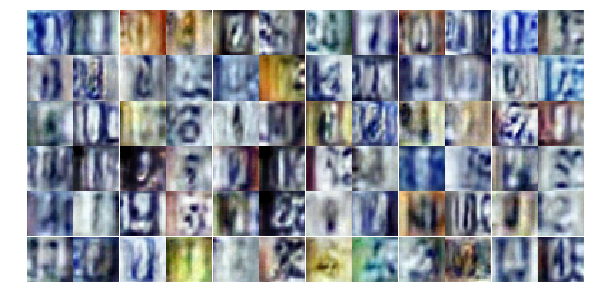

Epoch 16/25... Discriminator Loss: 0.6497... Generator Loss: 1.0732
Epoch 16/25... Discriminator Loss: 0.5073... Generator Loss: 1.9250
Epoch 16/25... Discriminator Loss: 0.8719... Generator Loss: 0.8149
Epoch 16/25... Discriminator Loss: 1.2850... Generator Loss: 0.4515
Epoch 16/25... Discriminator Loss: 2.1068... Generator Loss: 0.3765
Epoch 16/25... Discriminator Loss: 1.2358... Generator Loss: 0.5347
Epoch 16/25... Discriminator Loss: 0.6259... Generator Loss: 1.2200
Epoch 16/25... Discriminator Loss: 0.8518... Generator Loss: 0.9612
Epoch 16/25... Discriminator Loss: 0.7222... Generator Loss: 1.2993
Epoch 17/25... Discriminator Loss: 0.9003... Generator Loss: 1.8465


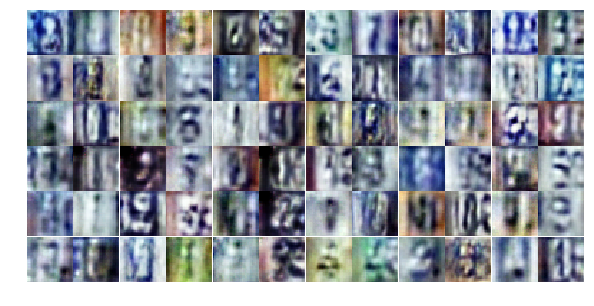

Epoch 17/25... Discriminator Loss: 0.7206... Generator Loss: 1.0438
Epoch 17/25... Discriminator Loss: 1.1613... Generator Loss: 1.8941
Epoch 17/25... Discriminator Loss: 0.4797... Generator Loss: 1.7077
Epoch 17/25... Discriminator Loss: 0.6358... Generator Loss: 1.4760
Epoch 17/25... Discriminator Loss: 0.6415... Generator Loss: 1.4318
Epoch 17/25... Discriminator Loss: 0.7592... Generator Loss: 0.8673
Epoch 17/25... Discriminator Loss: 0.9603... Generator Loss: 0.6669
Epoch 17/25... Discriminator Loss: 0.3077... Generator Loss: 1.8977
Epoch 17/25... Discriminator Loss: 0.5749... Generator Loss: 1.7910
Epoch 17/25... Discriminator Loss: 0.8862... Generator Loss: 0.8138


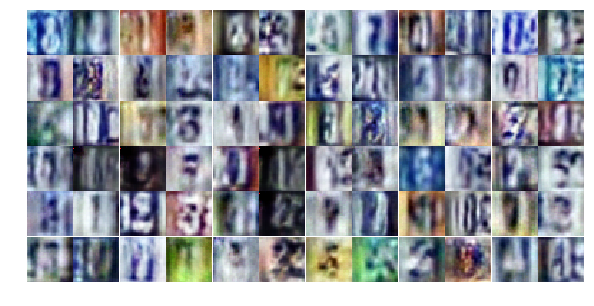

Epoch 17/25... Discriminator Loss: 0.9416... Generator Loss: 0.8956
Epoch 17/25... Discriminator Loss: 1.3351... Generator Loss: 0.4098
Epoch 17/25... Discriminator Loss: 0.8700... Generator Loss: 1.7697
Epoch 17/25... Discriminator Loss: 0.2583... Generator Loss: 1.9340
Epoch 17/25... Discriminator Loss: 0.5484... Generator Loss: 1.2254
Epoch 17/25... Discriminator Loss: 0.8378... Generator Loss: 1.2759
Epoch 17/25... Discriminator Loss: 0.8419... Generator Loss: 0.7969
Epoch 17/25... Discriminator Loss: 0.7541... Generator Loss: 1.0449
Epoch 17/25... Discriminator Loss: 0.3327... Generator Loss: 1.7497
Epoch 17/25... Discriminator Loss: 0.8469... Generator Loss: 0.7924


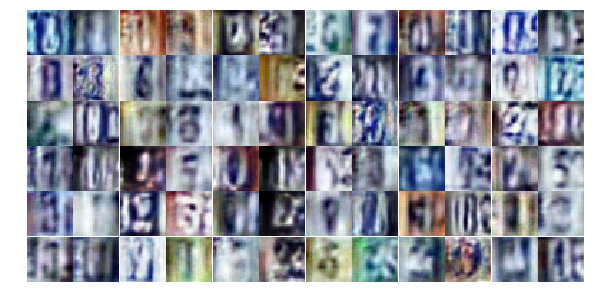

Epoch 17/25... Discriminator Loss: 0.7717... Generator Loss: 1.8316
Epoch 17/25... Discriminator Loss: 0.9551... Generator Loss: 0.6759
Epoch 17/25... Discriminator Loss: 0.8480... Generator Loss: 1.0410
Epoch 17/25... Discriminator Loss: 0.4344... Generator Loss: 1.5277
Epoch 17/25... Discriminator Loss: 1.6996... Generator Loss: 0.3362
Epoch 17/25... Discriminator Loss: 1.3108... Generator Loss: 0.6246
Epoch 17/25... Discriminator Loss: 0.8161... Generator Loss: 1.0797
Epoch 18/25... Discriminator Loss: 1.1332... Generator Loss: 0.5601
Epoch 18/25... Discriminator Loss: 0.3875... Generator Loss: 1.6461
Epoch 18/25... Discriminator Loss: 0.2205... Generator Loss: 3.4372


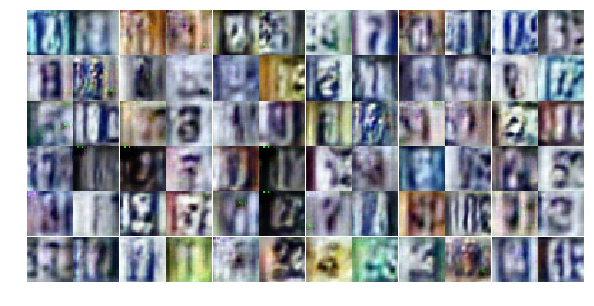

Epoch 18/25... Discriminator Loss: 1.1408... Generator Loss: 0.5390
Epoch 18/25... Discriminator Loss: 1.0164... Generator Loss: 1.1898
Epoch 18/25... Discriminator Loss: 0.5300... Generator Loss: 1.3524
Epoch 18/25... Discriminator Loss: 1.3063... Generator Loss: 1.9147
Epoch 18/25... Discriminator Loss: 0.7147... Generator Loss: 1.1755
Epoch 18/25... Discriminator Loss: 0.8858... Generator Loss: 1.2874
Epoch 18/25... Discriminator Loss: 0.9857... Generator Loss: 1.3662
Epoch 18/25... Discriminator Loss: 0.6309... Generator Loss: 1.1464
Epoch 18/25... Discriminator Loss: 0.2958... Generator Loss: 4.1224
Epoch 18/25... Discriminator Loss: 0.2626... Generator Loss: 1.8698


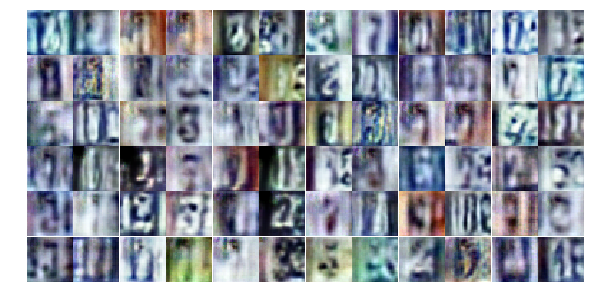

Epoch 18/25... Discriminator Loss: 0.8849... Generator Loss: 1.8513
Epoch 18/25... Discriminator Loss: 1.0605... Generator Loss: 0.5865
Epoch 18/25... Discriminator Loss: 0.3817... Generator Loss: 1.6462
Epoch 18/25... Discriminator Loss: 0.7004... Generator Loss: 1.6700
Epoch 18/25... Discriminator Loss: 0.6536... Generator Loss: 1.1674
Epoch 18/25... Discriminator Loss: 0.8951... Generator Loss: 1.0245
Epoch 18/25... Discriminator Loss: 0.3392... Generator Loss: 2.8884
Epoch 18/25... Discriminator Loss: 0.5783... Generator Loss: 1.1667
Epoch 18/25... Discriminator Loss: 0.4655... Generator Loss: 1.2990
Epoch 18/25... Discriminator Loss: 0.5822... Generator Loss: 1.8645


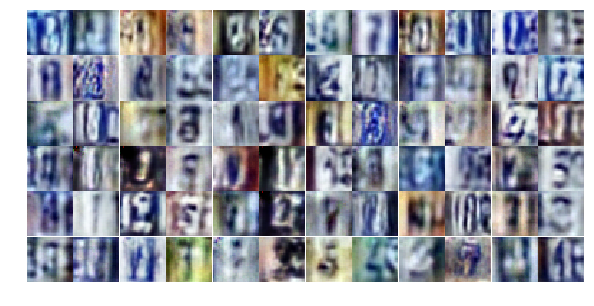

Epoch 18/25... Discriminator Loss: 1.6795... Generator Loss: 1.8251
Epoch 18/25... Discriminator Loss: 1.4432... Generator Loss: 1.6282
Epoch 18/25... Discriminator Loss: 0.2695... Generator Loss: 1.7650
Epoch 18/25... Discriminator Loss: 0.1755... Generator Loss: 2.5974
Epoch 18/25... Discriminator Loss: 0.3321... Generator Loss: 1.5407
Epoch 18/25... Discriminator Loss: 0.6621... Generator Loss: 1.8153
Epoch 19/25... Discriminator Loss: 0.2288... Generator Loss: 2.5905
Epoch 19/25... Discriminator Loss: 0.2217... Generator Loss: 2.0907
Epoch 19/25... Discriminator Loss: 0.2331... Generator Loss: 2.3021
Epoch 19/25... Discriminator Loss: 0.5895... Generator Loss: 1.9601


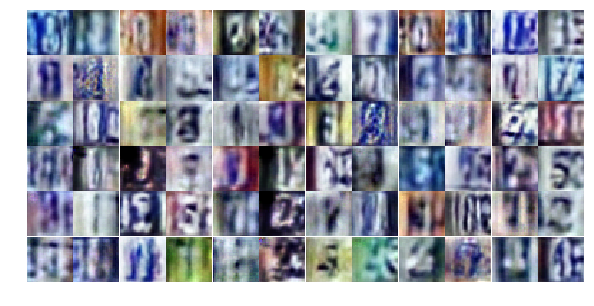

Epoch 19/25... Discriminator Loss: 0.7810... Generator Loss: 0.7709
Epoch 19/25... Discriminator Loss: 1.8207... Generator Loss: 1.7020
Epoch 19/25... Discriminator Loss: 0.5888... Generator Loss: 1.5864
Epoch 19/25... Discriminator Loss: 0.6546... Generator Loss: 1.6138
Epoch 19/25... Discriminator Loss: 0.6275... Generator Loss: 1.2631
Epoch 19/25... Discriminator Loss: 1.1569... Generator Loss: 1.3722
Epoch 19/25... Discriminator Loss: 0.6475... Generator Loss: 1.6314
Epoch 19/25... Discriminator Loss: 0.9071... Generator Loss: 0.9730
Epoch 19/25... Discriminator Loss: 0.3120... Generator Loss: 1.8930
Epoch 19/25... Discriminator Loss: 0.5694... Generator Loss: 1.4092


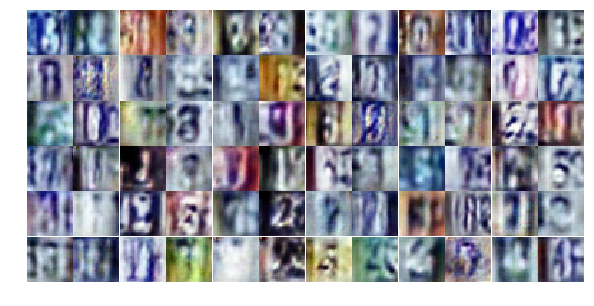

Epoch 19/25... Discriminator Loss: 0.5747... Generator Loss: 1.8377
Epoch 19/25... Discriminator Loss: 1.1077... Generator Loss: 0.8653
Epoch 19/25... Discriminator Loss: 0.4194... Generator Loss: 2.1502
Epoch 19/25... Discriminator Loss: 0.0171... Generator Loss: 6.6201
Epoch 19/25... Discriminator Loss: 0.1261... Generator Loss: 4.5887
Epoch 19/25... Discriminator Loss: 0.1673... Generator Loss: 2.4997
Epoch 19/25... Discriminator Loss: 0.4482... Generator Loss: 1.5239
Epoch 19/25... Discriminator Loss: 0.6692... Generator Loss: 1.0096
Epoch 19/25... Discriminator Loss: 0.2005... Generator Loss: 3.3471
Epoch 19/25... Discriminator Loss: 0.6035... Generator Loss: 1.8594


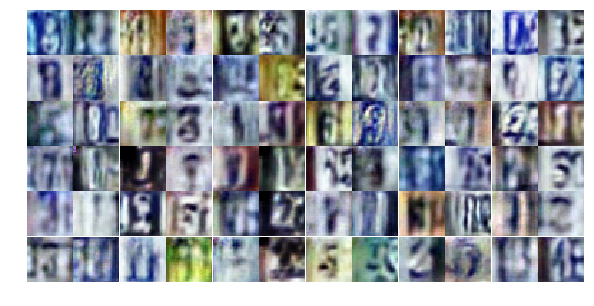

Epoch 19/25... Discriminator Loss: 0.3753... Generator Loss: 2.7953
Epoch 19/25... Discriminator Loss: 0.0913... Generator Loss: 3.5241
Epoch 19/25... Discriminator Loss: 0.0841... Generator Loss: 4.6312
Epoch 19/25... Discriminator Loss: 0.3288... Generator Loss: 1.5220
Epoch 19/25... Discriminator Loss: 0.0900... Generator Loss: 3.2284
Epoch 20/25... Discriminator Loss: 0.0816... Generator Loss: 3.3160
Epoch 20/25... Discriminator Loss: 0.0736... Generator Loss: 3.5648
Epoch 20/25... Discriminator Loss: 0.0832... Generator Loss: 3.2775
Epoch 20/25... Discriminator Loss: 0.0482... Generator Loss: 3.7951
Epoch 20/25... Discriminator Loss: 0.0780... Generator Loss: 3.3333


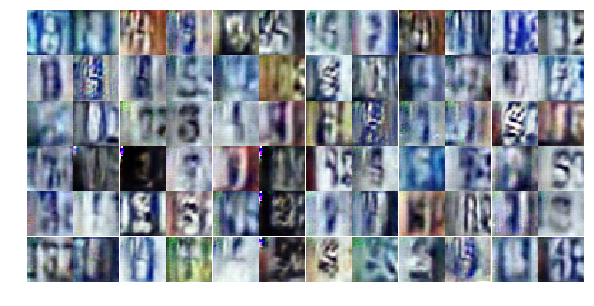

Epoch 20/25... Discriminator Loss: 0.2443... Generator Loss: 2.1415
Epoch 20/25... Discriminator Loss: 0.1076... Generator Loss: 5.6495
Epoch 20/25... Discriminator Loss: 0.1373... Generator Loss: 8.0014
Epoch 20/25... Discriminator Loss: 0.0314... Generator Loss: 5.5448
Epoch 20/25... Discriminator Loss: 0.0230... Generator Loss: 6.4847
Epoch 20/25... Discriminator Loss: 0.0530... Generator Loss: 4.4930
Epoch 20/25... Discriminator Loss: 0.0807... Generator Loss: 6.6941
Epoch 20/25... Discriminator Loss: 0.1459... Generator Loss: 3.0423
Epoch 20/25... Discriminator Loss: 0.2987... Generator Loss: 1.6879
Epoch 20/25... Discriminator Loss: 0.1932... Generator Loss: 2.1822


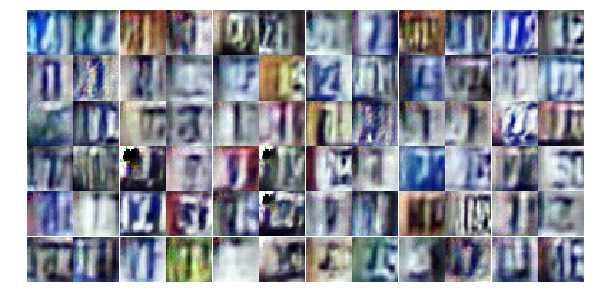

Epoch 20/25... Discriminator Loss: 0.0350... Generator Loss: 4.2299
Epoch 20/25... Discriminator Loss: 0.0472... Generator Loss: 3.6729
Epoch 20/25... Discriminator Loss: 0.2916... Generator Loss: 4.1705
Epoch 20/25... Discriminator Loss: 0.0302... Generator Loss: 4.7616
Epoch 20/25... Discriminator Loss: 0.0625... Generator Loss: 3.4911
Epoch 20/25... Discriminator Loss: 0.0523... Generator Loss: 3.7108
Epoch 20/25... Discriminator Loss: 0.0504... Generator Loss: 3.9720
Epoch 20/25... Discriminator Loss: 0.2860... Generator Loss: 2.6445
Epoch 20/25... Discriminator Loss: 0.0820... Generator Loss: 3.6954
Epoch 20/25... Discriminator Loss: 0.6564... Generator Loss: 1.1546


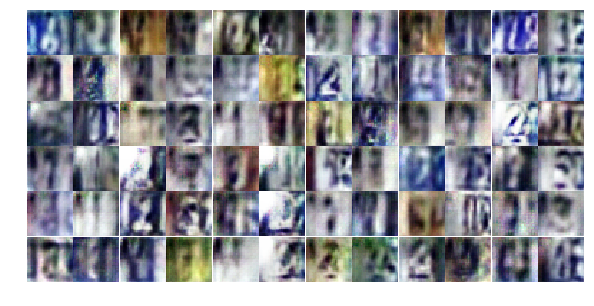

Epoch 20/25... Discriminator Loss: 1.3343... Generator Loss: 1.1085
Epoch 20/25... Discriminator Loss: 1.3171... Generator Loss: 0.8949
Epoch 20/25... Discriminator Loss: 1.1579... Generator Loss: 0.8771
Epoch 20/25... Discriminator Loss: 1.0814... Generator Loss: 0.8131
Epoch 21/25... Discriminator Loss: 0.5670... Generator Loss: 1.5472
Epoch 21/25... Discriminator Loss: 1.4900... Generator Loss: 2.2474
Epoch 21/25... Discriminator Loss: 1.0645... Generator Loss: 1.2876
Epoch 21/25... Discriminator Loss: 0.9978... Generator Loss: 0.6854
Epoch 21/25... Discriminator Loss: 0.5897... Generator Loss: 2.3756
Epoch 21/25... Discriminator Loss: 0.4130... Generator Loss: 1.6742


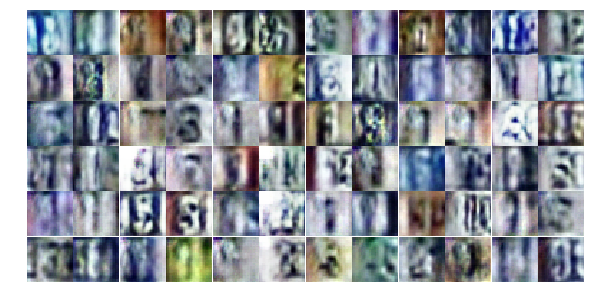

Epoch 21/25... Discriminator Loss: 0.3986... Generator Loss: 1.6751
Epoch 21/25... Discriminator Loss: 0.6271... Generator Loss: 1.1848
Epoch 21/25... Discriminator Loss: 0.7857... Generator Loss: 0.8522
Epoch 21/25... Discriminator Loss: 0.7676... Generator Loss: 1.3876
Epoch 21/25... Discriminator Loss: 0.4550... Generator Loss: 1.9574
Epoch 21/25... Discriminator Loss: 0.7873... Generator Loss: 1.1814
Epoch 21/25... Discriminator Loss: 0.7656... Generator Loss: 2.0443
Epoch 21/25... Discriminator Loss: 0.1910... Generator Loss: 3.3108
Epoch 21/25... Discriminator Loss: 1.0139... Generator Loss: 0.6806
Epoch 21/25... Discriminator Loss: 0.7512... Generator Loss: 1.1078


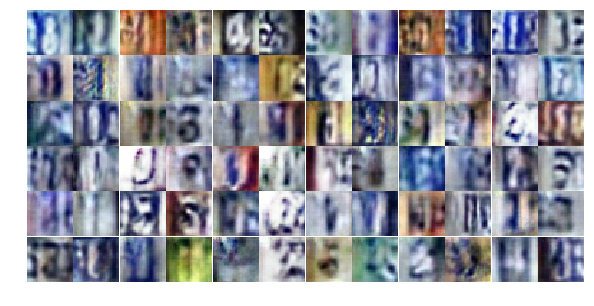

Epoch 21/25... Discriminator Loss: 0.1861... Generator Loss: 3.1220
Epoch 21/25... Discriminator Loss: 0.6385... Generator Loss: 2.1283
Epoch 21/25... Discriminator Loss: 0.6854... Generator Loss: 1.1440
Epoch 21/25... Discriminator Loss: 0.9346... Generator Loss: 1.8836
Epoch 21/25... Discriminator Loss: 0.6578... Generator Loss: 1.7145
Epoch 21/25... Discriminator Loss: 0.9554... Generator Loss: 2.5625
Epoch 21/25... Discriminator Loss: 1.5363... Generator Loss: 0.5142
Epoch 21/25... Discriminator Loss: 0.9851... Generator Loss: 0.6767
Epoch 21/25... Discriminator Loss: 0.7413... Generator Loss: 1.8477
Epoch 21/25... Discriminator Loss: 0.9649... Generator Loss: 0.7379


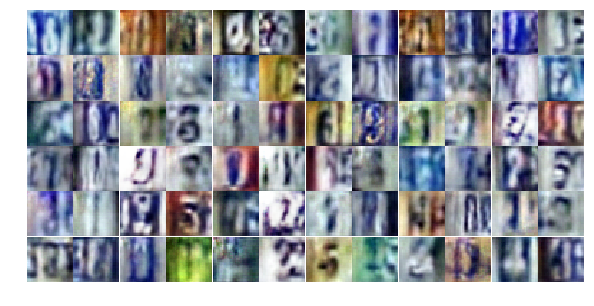

Epoch 21/25... Discriminator Loss: 1.6567... Generator Loss: 3.1034
Epoch 21/25... Discriminator Loss: 1.0473... Generator Loss: 0.9531
Epoch 22/25... Discriminator Loss: 1.0060... Generator Loss: 0.8447
Epoch 22/25... Discriminator Loss: 0.6359... Generator Loss: 2.3358
Epoch 22/25... Discriminator Loss: 0.7764... Generator Loss: 1.4722
Epoch 22/25... Discriminator Loss: 0.8489... Generator Loss: 0.8646
Epoch 22/25... Discriminator Loss: 0.7616... Generator Loss: 1.0947
Epoch 22/25... Discriminator Loss: 0.8824... Generator Loss: 1.2969
Epoch 22/25... Discriminator Loss: 0.3299... Generator Loss: 3.1523
Epoch 22/25... Discriminator Loss: 0.7473... Generator Loss: 0.9174


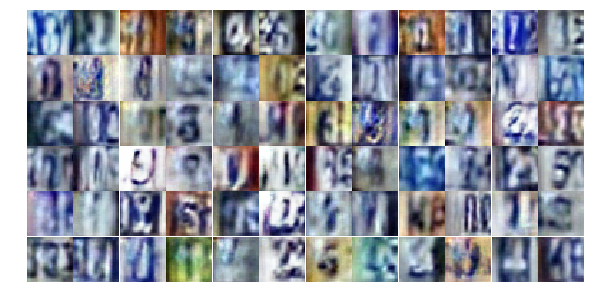

Epoch 22/25... Discriminator Loss: 0.7951... Generator Loss: 1.0526
Epoch 22/25... Discriminator Loss: 0.0696... Generator Loss: 3.6058
Epoch 22/25... Discriminator Loss: 0.0940... Generator Loss: 3.1602
Epoch 22/25... Discriminator Loss: 0.1160... Generator Loss: 4.0146
Epoch 22/25... Discriminator Loss: 0.0498... Generator Loss: 4.2263
Epoch 22/25... Discriminator Loss: 0.0997... Generator Loss: 2.8835
Epoch 22/25... Discriminator Loss: 0.1225... Generator Loss: 2.7677
Epoch 22/25... Discriminator Loss: 0.0184... Generator Loss: 5.6324
Epoch 22/25... Discriminator Loss: 0.0822... Generator Loss: 2.9893
Epoch 22/25... Discriminator Loss: 0.0644... Generator Loss: 4.3302


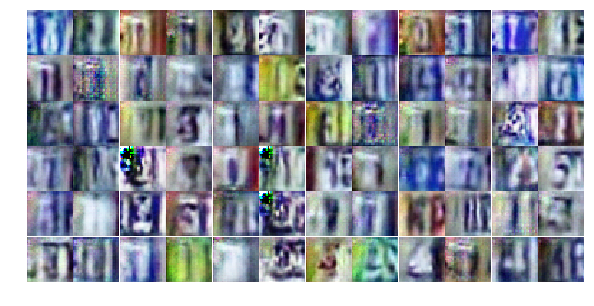

Epoch 22/25... Discriminator Loss: 0.0591... Generator Loss: 3.7661
Epoch 22/25... Discriminator Loss: 0.0204... Generator Loss: 6.4677
Epoch 22/25... Discriminator Loss: 0.0171... Generator Loss: 5.0411
Epoch 22/25... Discriminator Loss: 0.0791... Generator Loss: 5.4166
Epoch 22/25... Discriminator Loss: 0.0638... Generator Loss: 3.2750
Epoch 22/25... Discriminator Loss: 0.1911... Generator Loss: 2.1270
Epoch 22/25... Discriminator Loss: 0.0412... Generator Loss: 4.2164
Epoch 22/25... Discriminator Loss: 0.0516... Generator Loss: 6.6101
Epoch 22/25... Discriminator Loss: 0.0567... Generator Loss: 3.5202
Epoch 22/25... Discriminator Loss: 0.0789... Generator Loss: 3.2500


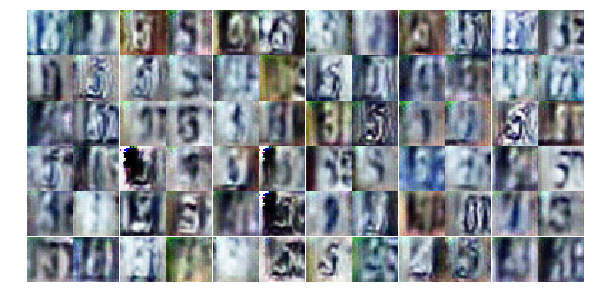

Epoch 22/25... Discriminator Loss: 0.0690... Generator Loss: 4.4418
Epoch 23/25... Discriminator Loss: 0.1017... Generator Loss: 3.1267
Epoch 23/25... Discriminator Loss: 0.0965... Generator Loss: 2.8205
Epoch 23/25... Discriminator Loss: 0.0509... Generator Loss: 4.4513
Epoch 23/25... Discriminator Loss: 0.0402... Generator Loss: 4.3007
Epoch 23/25... Discriminator Loss: 0.1179... Generator Loss: 2.6177
Epoch 23/25... Discriminator Loss: 0.0461... Generator Loss: 6.6094
Epoch 23/25... Discriminator Loss: 0.0559... Generator Loss: 5.3796
Epoch 23/25... Discriminator Loss: 0.2220... Generator Loss: 1.8501
Epoch 23/25... Discriminator Loss: 0.0788... Generator Loss: 3.3444


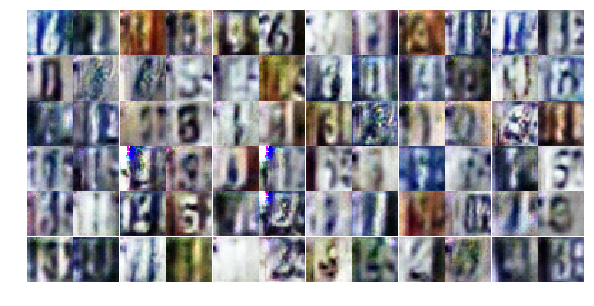

Epoch 23/25... Discriminator Loss: 0.1747... Generator Loss: 2.1211
Epoch 23/25... Discriminator Loss: 0.0162... Generator Loss: 5.8120
Epoch 23/25... Discriminator Loss: 0.0490... Generator Loss: 8.6504
Epoch 23/25... Discriminator Loss: 0.0536... Generator Loss: 3.9147
Epoch 23/25... Discriminator Loss: 0.0642... Generator Loss: 3.5277
Epoch 23/25... Discriminator Loss: 0.5626... Generator Loss: 1.4346
Epoch 23/25... Discriminator Loss: 1.5531... Generator Loss: 3.0587
Epoch 23/25... Discriminator Loss: 0.3715... Generator Loss: 2.2382
Epoch 23/25... Discriminator Loss: 0.4738... Generator Loss: 1.3657
Epoch 23/25... Discriminator Loss: 0.9534... Generator Loss: 0.8794


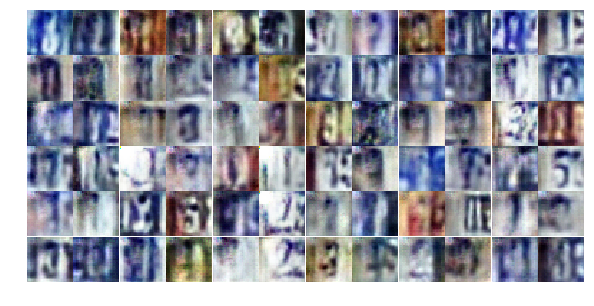

Epoch 23/25... Discriminator Loss: 0.6950... Generator Loss: 1.8177
Epoch 23/25... Discriminator Loss: 0.1358... Generator Loss: 2.9234
Epoch 23/25... Discriminator Loss: 0.1476... Generator Loss: 2.5531
Epoch 23/25... Discriminator Loss: 0.2052... Generator Loss: 2.4526
Epoch 23/25... Discriminator Loss: 0.3082... Generator Loss: 3.1195
Epoch 23/25... Discriminator Loss: 0.1351... Generator Loss: 2.9448
Epoch 23/25... Discriminator Loss: 0.0621... Generator Loss: 3.4756
Epoch 23/25... Discriminator Loss: 0.0649... Generator Loss: 3.5766
Epoch 23/25... Discriminator Loss: 0.0590... Generator Loss: 3.6595
Epoch 23/25... Discriminator Loss: 0.0912... Generator Loss: 3.3754


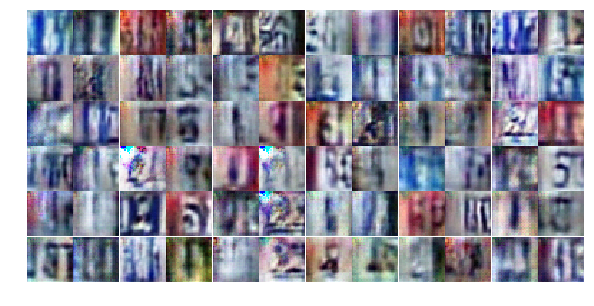

Epoch 24/25... Discriminator Loss: 0.0616... Generator Loss: 3.9206
Epoch 24/25... Discriminator Loss: 0.0390... Generator Loss: 5.0676
Epoch 24/25... Discriminator Loss: 0.0183... Generator Loss: 9.2080
Epoch 24/25... Discriminator Loss: 0.0415... Generator Loss: 6.2425
Epoch 24/25... Discriminator Loss: 0.0269... Generator Loss: 5.7314
Epoch 24/25... Discriminator Loss: 0.0244... Generator Loss: 5.5149
Epoch 24/25... Discriminator Loss: 0.0154... Generator Loss: 6.9508
Epoch 24/25... Discriminator Loss: 0.0416... Generator Loss: 3.8428
Epoch 24/25... Discriminator Loss: 0.0275... Generator Loss: 5.4203
Epoch 24/25... Discriminator Loss: 0.8413... Generator Loss: 5.6152


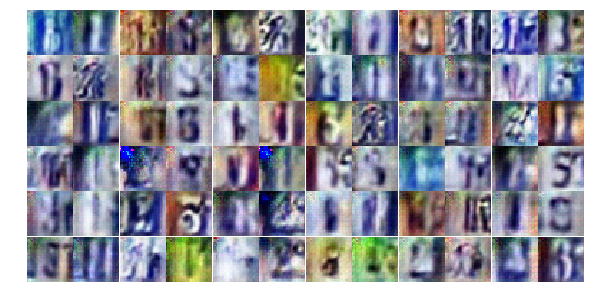

Epoch 24/25... Discriminator Loss: 1.0769... Generator Loss: 0.5927
Epoch 24/25... Discriminator Loss: 0.4878... Generator Loss: 1.2653
Epoch 24/25... Discriminator Loss: 0.1473... Generator Loss: 3.5755
Epoch 24/25... Discriminator Loss: 7.8869... Generator Loss: 8.1859
Epoch 24/25... Discriminator Loss: 1.1642... Generator Loss: 0.9861
Epoch 24/25... Discriminator Loss: 1.2873... Generator Loss: 1.0186
Epoch 24/25... Discriminator Loss: 0.9059... Generator Loss: 1.0195
Epoch 24/25... Discriminator Loss: 2.1287... Generator Loss: 0.1859
Epoch 24/25... Discriminator Loss: 0.9479... Generator Loss: 1.1582
Epoch 24/25... Discriminator Loss: 0.7789... Generator Loss: 2.1751


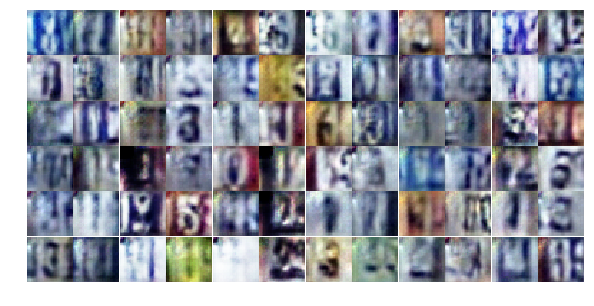

Epoch 24/25... Discriminator Loss: 0.7328... Generator Loss: 1.0713
Epoch 24/25... Discriminator Loss: 0.6947... Generator Loss: 0.9984
Epoch 24/25... Discriminator Loss: 1.4346... Generator Loss: 2.9754
Epoch 24/25... Discriminator Loss: 0.7684... Generator Loss: 0.9331
Epoch 24/25... Discriminator Loss: 0.4925... Generator Loss: 1.3185
Epoch 24/25... Discriminator Loss: 0.4851... Generator Loss: 1.4907
Epoch 24/25... Discriminator Loss: 0.9101... Generator Loss: 2.2061
Epoch 24/25... Discriminator Loss: 0.8482... Generator Loss: 0.9210
Epoch 25/25... Discriminator Loss: 0.4450... Generator Loss: 1.4704
Epoch 25/25... Discriminator Loss: 0.8682... Generator Loss: 0.7879


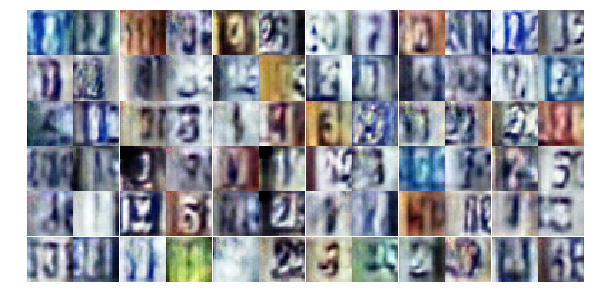

Epoch 25/25... Discriminator Loss: 0.8146... Generator Loss: 1.5501
Epoch 25/25... Discriminator Loss: 0.9003... Generator Loss: 1.3878
Epoch 25/25... Discriminator Loss: 1.6169... Generator Loss: 0.3112
Epoch 25/25... Discriminator Loss: 1.1893... Generator Loss: 1.4063
Epoch 25/25... Discriminator Loss: 0.6797... Generator Loss: 1.1132
Epoch 25/25... Discriminator Loss: 0.7707... Generator Loss: 1.6927
Epoch 25/25... Discriminator Loss: 0.5536... Generator Loss: 1.1884
Epoch 25/25... Discriminator Loss: 1.2305... Generator Loss: 1.9851
Epoch 25/25... Discriminator Loss: 0.6772... Generator Loss: 1.0403
Epoch 25/25... Discriminator Loss: 0.6866... Generator Loss: 1.8060


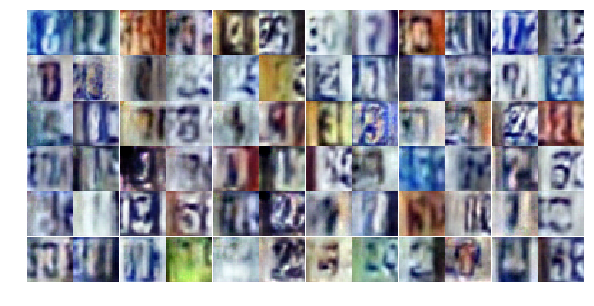

Epoch 25/25... Discriminator Loss: 0.5278... Generator Loss: 1.4929
Epoch 25/25... Discriminator Loss: 0.5764... Generator Loss: 1.1745
Epoch 25/25... Discriminator Loss: 0.0536... Generator Loss: 5.6907
Epoch 25/25... Discriminator Loss: 0.0963... Generator Loss: 8.5168
Epoch 25/25... Discriminator Loss: 0.6560... Generator Loss: 1.0657
Epoch 25/25... Discriminator Loss: 1.0183... Generator Loss: 0.7152
Epoch 25/25... Discriminator Loss: 1.3543... Generator Loss: 0.8963
Epoch 25/25... Discriminator Loss: 0.8418... Generator Loss: 1.0541
Epoch 25/25... Discriminator Loss: 0.6057... Generator Loss: 1.0406
Epoch 25/25... Discriminator Loss: 0.8423... Generator Loss: 1.1490


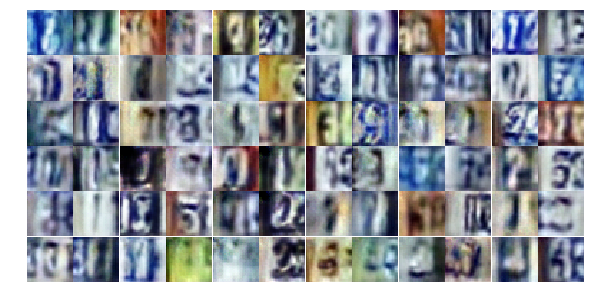

Epoch 25/25... Discriminator Loss: 1.1489... Generator Loss: 0.6219
Epoch 25/25... Discriminator Loss: 0.9265... Generator Loss: 1.3281
Epoch 25/25... Discriminator Loss: 0.5101... Generator Loss: 1.2595
Epoch 25/25... Discriminator Loss: 1.3122... Generator Loss: 2.5991
Epoch 25/25... Discriminator Loss: 0.6196... Generator Loss: 1.1724
Epoch 25/25... Discriminator Loss: 0.4909... Generator Loss: 1.9694
Epoch 25/25... Discriminator Loss: 0.9911... Generator Loss: 0.7581


In [18]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

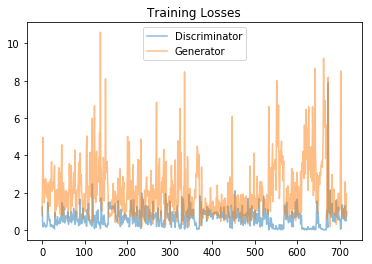

In [19]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

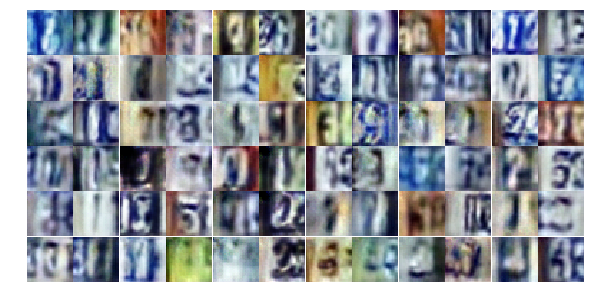

In [20]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))